# **Purpose of county_education Notebook**

The function and purpose of this notebook is as a partial analysis of time series data collected on unemployment rate in counties in California. <br>

We aim to create a binary classifier out of 'Unemployment Rate', and determine whether or not the highest unemployment rate in a county happened during the pandemic or prior to.<br>

The reason for using a binary classifier to determine whether or not a county's highest unemployment rate happened during the pandemic or not is to create an understanding that while all counties in California suffered unemployability due to the pandemic, counties that experienced higher unemployment rates outside of the pandemic would be subject to our educational analysis. The goal then is to determine the general education level in that county according to the __[United States Census Bureau](https://www.census.gov/)__ and consider whether or not that has to do with a county's unemployment rate. <br>

Another main reason for creating another notebook for this data is to consider __seasonality__ and exploring what that means for the larger business suggestion for the state of California's __[EDD](https://edd.ca.gov/about_edd/#:~:text=The%20Employment%20Development%20Department%20(EDD,service%20locations%20throughout%20the%20state.)__ (Employment Development Department). <br>

## **So why ag workers?**

Just based on the nature of the job there is a large degree of seasonality but also, the EDD already has an __[educational program for migrant and ag workers](https://edd.ca.gov/en/jobs_and_training/Migrant_and_Seasonal_Farm_Worker_Outreach_Program/)__. They are incredibly prevalent in California (the fifth largest supplier of food in the world) and these workers experience a large amount of unemployment during the offseason. What if there were an eduational opportunity available to these workers that could also fill another void in California's workforce by focusing and creating these educational opportunities on skilled labor jobs. <br>

## **Dataset**

__['Local Area Unemployment Statistics'](https://data.ca.gov/dataset/local-area-unemployment-statistics-laus)__  current as of March, 2023. <br>

## **Business Problem**

According to a recent article posted on what could be considered America's most uncelebrated holiday __['National Skilled Trades Day'](https://gvwire.com/2023/05/02/on-national-skilled-trades-day-americas-labor-shortage-looms/)__, there is a high need for skilled labor in the job market. Specifically, these are blue collar jobs in the trades (carpentry, HVAC, iron work, sheet metal, and aviation). There is a growing sentiment in the United States that there aren't people willing to work, but according to the article by Elen  Theodossiou and Steven F. Hipple, __['Unemployment remains high in 2010'](https://www.bls.gov/opub/mlr/2011/03/art1full.pdf)__, __"Workers with less education continued to experience a substantially higher unemployment rate than did better educated members of the labor force."__(4)
<br>

Taking into consideration that ALL the jobs highlighted in the article __['National Skilled Trades Day'](https://gvwire.com/2023/05/02/on-national-skilled-trades-day-americas-labor-shortage-looms/)__ require some kind of certificate of completion from a trade school or on the job training, it is our intention to look at counties in California with high unemployment rates and attempt to identify members of specific business sectors that the EDD (State of California Employment Development Department) can recruit for training in these high demand jobs.
<br>

Are there then groups in our data on counties and unemployment rate that may shed light on a potential group of candidates for a proposal for an EDD sponsored version of job training? That is the goal of our project.

## **Method of Analysis**

Based on California county data, where counties experienced historic unemployment rates __higher__ than the pandemic, we will explore level of education and create a baseline for analysis. <br>

For cities that experience higher unemployment rates outside of the expected (2020's pandemic), we will graph unemployment rate, education level, and predictive model for future recommendations. <br>


In [ ]:
import pandas as pd
import matplotlib as plt
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.style.use('ggplot')
plt.style.use('fivethirtyeight')

### **Function to plot county information**

In [ ]:
def plot_county(county):
    county = county.sort_index()
    plot = county.drop(['Labor Force',
                        'Employment',
                        'Unemployment'], axis =1)
    plot.plot(figsize = (16,6))
    plt.xlabel('Date', fontsize = 18)
    plt.ylabel('Unemployment Rate', fontsize = 18)

In [ ]:
# call on our data
url = 'https://raw.githubusercontent.com/joshstruggles/Local-Area-Unemployment-Statistics-California/main/data/05.10.23.csv'

df = pd.read_csv(url)
df.head()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
0,State,California,01/01/1976,1976,January,N,Final,9672362,8668016,1004346,0.104
1,State,California,01/01/1976,1976,January,Y,Final,9774280,8875685,898595,0.092
2,County,Los Angeles County,01/01/1976,1976,January,N,Final,3364151,3040058,324093,0.096
3,County,Los Angeles County,01/01/1976,1976,January,Y,Final,3381856,3081806,300050,0.089
4,Metropolitan Area,Los Angeles-Long Beach-Glendale MD,01/01/1976,1976,January,N,Final,3364151,3040058,324093,0.096


We are looking to use 'Unemployment Rate' as our primary independent variable

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197384 entries, 0 to 197383
Data columns (total 11 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Area Type                     197384 non-null  object 
 1   Area Name                     197384 non-null  object 
 2   Date                          197384 non-null  object 
 3   Year                          197384 non-null  int64  
 4   Month                         197384 non-null  object 
 5   Seasonally Adjusted (Y/N)     197384 non-null  object 
 6   Status (Preliminary / Final)  197384 non-null  object 
 7   Labor Force                   197384 non-null  int64  
 8   Employment                    197384 non-null  int64  
 9   Unemployment                  197384 non-null  int64  
 10  Unemployment Rate             197384 non-null  float64
dtypes: float64(1), int64(4), object(6)
memory usage: 16.6+ MB


In [ ]:
df.shape

(197384, 11)

In [ ]:
# Let's take a look at what 'Area Type' value counts are
df['Area Type'].value_counts()

Sub-County Place     148188
County                23818
Metropolitan Area     12276
MSA                   10374
Metro Division         1596
State                  1132
Name: Area Type, dtype: int64

In [ ]:
# Get value counts from 'Area Name'
df['Area Name'].value_counts()

California                                                    1132
Los Angeles-Long Beach-Glendale MD                            1132
Los Angeles County                                            1132
Oakland-Hayward-Berkeley, CA Met Div                           399
San Francisco-Redwood City-South San Francisco, CA Met Div     399
                                                              ... 
Gonzales city                                                  159
Goshen CDP                                                     159
Graeagle CDP                                                   159
Grand Terrace city                                             159
Lakewood city                                                  159
Name: Area Name, Length: 1050, dtype: int64

There is a significant amount of information. We see that there is no null data, 11 columns, 197,384 rows and 1,050 cities covered in the dataset.

### __[California Agricultural Production Statistics](https://www.cdfa.ca.gov/Statistics/)__

According to the California Agricultural Production Statistics these are the top 10 agricultural commodities coming out of the state: <br>

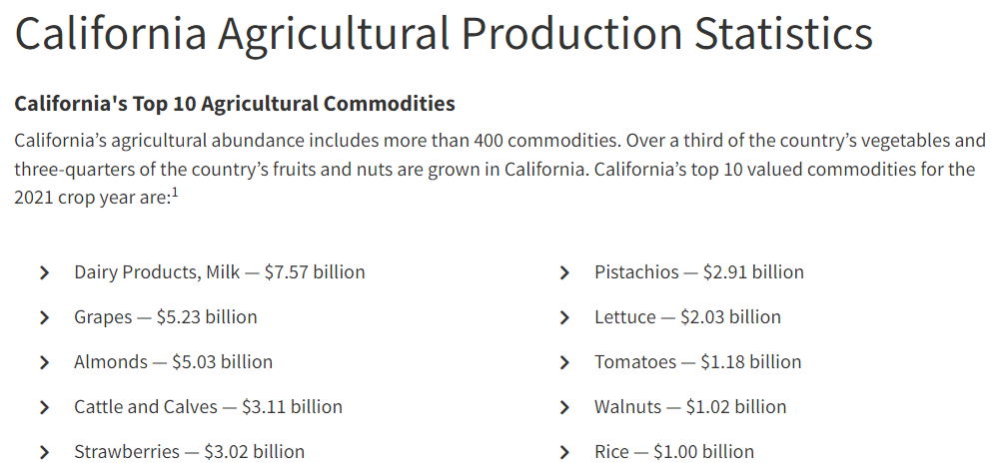

Eight of the top ten agricultural commodities coming out of California are seasonal products.

In [ ]:
df1 = df.copy()

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
# set index as our new df['Date'] dataset
df = df.set_index(df['Date'])

In [ ]:
# Create variable df_current to process only most current data
mask = (df['Date'] == '2023-03-01')
current = df.loc[mask]
df_current = pd.DataFrame(current)

In [ ]:
# drop redundant date data that is already in index
df_current = df_current.drop(['Date', 'Year', 'Month'], axis =1)
df_current.head()

,Area Type,Area Name,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
Date,,,,,,,,
2023-03-01,State,California,N,Preliminary,19498300,18560500,937800,0.048
2023-03-01,State,California,Y,Preliminary,19371100,18511400,859600,0.044
2023-03-01,County,Alameda County,N,Preliminary,832900,801500,31400,0.038
2023-03-01,County,Alpine County,N,Preliminary,620,590,30,0.053
2023-03-01,County,Amador County,N,Preliminary,14580,13740,840,0.058


In [ ]:
# Split new variable to only Area Type = 'County'
df_current_county = df_current.loc[df_current['Area Type'] == 'County']
df_current_county.head()

,Area Type,Area Name,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
Date,,,,,,,,
2023-03-01,County,Alameda County,N,Preliminary,832900,801500,31400,0.038
2023-03-01,County,Alpine County,N,Preliminary,620,590,30,0.053
2023-03-01,County,Amador County,N,Preliminary,14580,13740,840,0.058
2023-03-01,County,Butte County,N,Preliminary,94100,88800,5300,0.057
2023-03-01,County,Calaveras County,N,Preliminary,22510,21470,1040,0.046


In [ ]:
# shape of our dataset
df_current_county.shape

(59, 8)

There are 59 distinct counties in our dataset

In [ ]:
# show values for 'Seasonally Adjusted (Y/N)' & 'Status(Preliminary / Final')
print(df_current_county['Seasonally Adjusted (Y/N)'].value_counts())
print()
print(df_current_county['Status (Preliminary / Final)'].value_counts())

N    58
Y     1
Name: Seasonally Adjusted (Y/N), dtype: int64

Preliminary    59
Name: Status (Preliminary / Final), dtype: int64


'Area Type', 'Seasonally Adjusuted (Y/N)', and 'Status (Preliminary / Final)' don't seem to add any information in our dataset that we don't already know (or need). Let's remove these three.

In [ ]:
# drop columns mentioned above
df_county = df_current_county.drop(['Area Type',
                                    'Seasonally Adjusted (Y/N)',
                                    'Status (Preliminary / Final)'], axis =1)

In [ ]:
df_county.sort_values('Unemployment Rate',ascending = False)

,Area Name,Labor Force,Employment,Unemployment,Unemployment Rate
Date,,,,,
2023-03-01,Colusa County,10700,8650,2050,0.192
2023-03-01,Imperial County,71400,60300,11100,0.156
2023-03-01,Tulare County,212400,188400,23900,0.113
2023-03-01,Plumas County,7220,6410,810,0.112
2023-03-01,Merced County,118100,104800,13200,0.112
2023-03-01,Kings County,58500,52800,5700,0.097
2023-03-01,Kern County,392300,354700,37600,0.096
2023-03-01,Sutter County,47500,43000,4500,0.096
2023-03-01,Monterey County,225300,203600,21700,0.096


## **Make datetime information**

The previous method worked to get our most recent data but we still need to create datetime information to order our data with.

In [ ]:
# sort values of 'Year' and 'Month'
df1 = df1.sort_values(['Year', 'Month'])

In [ ]:
# create a dictionary called 'months' with numeric values in ascending order
months = {
    'January' : 1,
    'February' : 2,
    'March' : 3,
    'April' : 4,
    'May' : 5,
    'June' : 6,
    'July' : 7,
    'August' : 8,
    'September' : 9,
    'October' : 10,
    'November' : 11,
    'December' : 12
}

In [ ]:
# function to transform month into an integer
def transform(month):
    return months[month]

In [ ]:
# Apply our transform function to month column
df1['Month'] = df1['Month'].apply(transform)

In [ ]:
# preview to make sure function worked
df1.head()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
48678,State,California,04/01/1976,1976,4,N,Final,9692493,8835232,857261,0.088
48679,State,California,04/01/1976,1976,4,Y,Final,9789023,8902662,886361,0.091
48680,County,Los Angeles County,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083
48681,County,Los Angeles County,04/01/1976,1976,4,Y,Final,3385126,3089190,295936,0.087
48682,Metropolitan Area,Los Angeles-Long Beach-Glendale MD,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083


We should halt here and address our 'Seasonally Adjusted (Y/N)' column before progressing any further. <br>

### **Seasonal Adjustment**

is the attempt of statisticiant to adjust the influences of predicatable seasonal patterns to reveal how employment and unemployment change from month to month. For our purposes this will not really be a consideration so we will remove it from our data.

In [ ]:
df1['Seasonally Adjusted (Y/N)'].value_counts()

N    183716
Y     13668
Name: Seasonally Adjusted (Y/N), dtype: int64

In [ ]:
df1.drop(df1[df1['Seasonally Adjusted (Y/N)'] == 'Y'].index, inplace = True)
df1.head()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
48678,State,California,04/01/1976,1976,4,N,Final,9692493,8835232,857261,0.088
48680,County,Los Angeles County,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083
48682,Metropolitan Area,Los Angeles-Long Beach-Glendale MD,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083
109490,State,California,08/01/1976,1976,8,N,Final,10115963,9196592,919371,0.091
109492,County,Los Angeles County,08/01/1976,1976,8,N,Final,3430133,3114869,315264,0.092


In [ ]:
df1['Seasonally Adjusted (Y/N)'].value_counts()

N    183716
Name: Seasonally Adjusted (Y/N), dtype: int64

Great, we can move back to our datetime issue.

In [ ]:
# We've already made 'Year' and 'Month' columns into integers let's move forward with combining them.
df1['month_year'] = pd.to_datetime(df1['Date']).dt.to_period('M')
df1.head()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate,month_year
48678,State,California,04/01/1976,1976,4,N,Final,9692493,8835232,857261,0.088,1976-04
48680,County,Los Angeles County,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083,1976-04
48682,Metropolitan Area,Los Angeles-Long Beach-Glendale MD,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083,1976-04
109490,State,California,08/01/1976,1976,8,N,Final,10115963,9196592,919371,0.091,1976-08
109492,County,Los Angeles County,08/01/1976,1976,8,N,Final,3430133,3114869,315264,0.092,1976-08


Great! In order to move forward let's make sure we are looking at 'Area Type'(s) that are Counties. <br>

### **Counties**

Let's make sure we are looking at counties before continuing with creating a datetime index.

In [ ]:
df1['Area Type'].value_counts()

Sub-County Place     148188
County                23252
Metropolitan Area     11710
State                   566
Name: Area Type, dtype: int64

In [ ]:
# Call on the value you want from 'Area Type'
df1.loc[:, 'Area Type'] = 'County'

In [ ]:
# Check work
df1.head()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate,month_year
48678,County,California,04/01/1976,1976,4,N,Final,9692493,8835232,857261,0.088,1976-04
48680,County,Los Angeles County,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083,1976-04
48682,County,Los Angeles-Long Beach-Glendale MD,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083,1976-04
109490,County,California,08/01/1976,1976,8,N,Final,10115963,9196592,919371,0.091,1976-08
109492,County,Los Angeles County,08/01/1976,1976,8,N,Final,3430133,3114869,315264,0.092,1976-08


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183716 entries, 48678 to 48677
Data columns (total 12 columns):
 #   Column                        Non-Null Count   Dtype    
---  ------                        --------------   -----    
 0   Area Type                     183716 non-null  object   
 1   Area Name                     183716 non-null  object   
 2   Date                          183716 non-null  object   
 3   Year                          183716 non-null  int64    
 4   Month                         183716 non-null  int64    
 5   Seasonally Adjusted (Y/N)     183716 non-null  object   
 6   Status (Preliminary / Final)  183716 non-null  object   
 7   Labor Force                   183716 non-null  int64    
 8   Employment                    183716 non-null  int64    
 9   Unemployment                  183716 non-null  int64    
 10  Unemployment Rate             183716 non-null  float64  
 11  month_year                    183716 non-null  period[M]
dtypes: float64(1)

In [ ]:
df1.index = df1['month_year']
del df1['month_year']
df1.sort_index()
df1.head()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
month_year,,,,,,,,,,,
1976-04,County,California,04/01/1976,1976,4,N,Final,9692493,8835232,857261,0.088
1976-04,County,Los Angeles County,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083
1976-04,County,Los Angeles-Long Beach-Glendale MD,04/01/1976,1976,4,N,Final,3362757,3082562,280195,0.083
1976-08,County,California,08/01/1976,1976,8,N,Final,10115963,9196592,919371,0.091
1976-08,County,Los Angeles County,08/01/1976,1976,8,N,Final,3430133,3114869,315264,0.092


In [ ]:
df1.tail()

,Area Type,Area Name,Date,Year,Month,Seasonally Adjusted (Y/N),Status (Preliminary / Final),Labor Force,Employment,Unemployment,Unemployment Rate
month_year,,,,,,,,,,,
2023-03,County,Yountville town,03/01/2023,2023,3,N,Preliminary,1500,1400,100,0.056
2023-03,County,Yreka city,03/01/2023,2023,3,N,Preliminary,2920,2800,130,0.043
2023-03,County,Yuba City city,03/01/2023,2023,3,N,Preliminary,32700,29600,3100,0.094
2023-03,County,Yucaipa city,03/01/2023,2023,3,N,Preliminary,26800,25800,1000,0.038
2023-03,County,Yucca Valley town,03/01/2023,2023,3,N,Preliminary,9600,9000,600,0.063


In [ ]:
# from here, drop all columns we will not need and go back to using 'df' variable.
df = df1.drop(['Area Type',
              'Date',
              'Year',
              'Month',
              'Seasonally Adjusted (Y/N)',
              'Status (Preliminary / Final)'], axis =1)

In [ ]:
df.head()

,Area Name,Labor Force,Employment,Unemployment,Unemployment Rate
month_year,,,,,
1976-04,California,9692493,8835232,857261,0.088
1976-04,Los Angeles County,3362757,3082562,280195,0.083
1976-04,Los Angeles-Long Beach-Glendale MD,3362757,3082562,280195,0.083
1976-08,California,10115963,9196592,919371,0.091
1976-08,Los Angeles County,3430133,3114869,315264,0.092


In [ ]:
df['Area Name'].value_counts()

California                            566
Los Angeles-Long Beach-Glendale MD    566
Los Angeles County                    566
Tuolumne County                       398
Fresno MSA                            398
                                     ... 
Garden Acres CDP                      159
Garden Grove city                     159
Georgetown CDP                        159
Gilroy city                           159
Yucca Valley town                     159
Name: Area Name, Length: 1020, dtype: int64

For some reason Los Angeles county has kept a record of their labor force since the 70's, the remaining counties begin from 1990. <br>

### **Has every county been keeping data for the same amount of time?**

Bakersfield started in 1990, but we know that our datset began in 1976 (county information). Though it will not be ultimately important for our time series analysis of unemployment rate in each metropolitan area, it may be wise to know when each of these began. Let's separating our dataset by MSA.

In [ ]:
# Break dataset into county areas using county name minus
# the word, 'county' in variable name
Los_Angeles = df.loc[df['Area Name'] == 'Los Angeles County']
Alameda = df.loc[df['Area Name'] == 'Alameda County']
San_Bernardino = df.loc[df['Area Name'] == 'San Bernardino County']
Riverside = df.loc[df['Area Name'] == 'Riverside County']
Placer = df.loc[df['Area Name'] == 'Placer County']
Siskiyou = df.loc[df['Area Name'] == 'Siskiyou County']
Madera = df.loc[df['Area Name'] == 'Madera County']
El_Dorado = df.loc[df['Area Name'] == 'El Dorado County']
Calaveras = df.loc[df['Area Name'] == 'Calaveras County']
Sutter = df.loc[df['Area Name'] == 'Sutter County']
Colusa = df.loc[df['Area Name'] == 'Colusa County']
Butte = df.loc[df['Area Name'] == 'Butte County']
Lake = df.loc[df['Area Name'] == 'Lake County']
Yuba = df.loc[df['Area Name'] == 'Yuba County']
Del_Norte = df.loc[df['Area Name'] == 'Del Norte County']
Yolo = df.loc[df['Area Name'] == 'Yolo County']
San_Diego = df.loc[df['Area Name'] == 'San Diego County']
Humboldt = df.loc[df['Area Name'] == 'Humboldt County']
Amador = df.loc[df['Area Name'] == 'Amador County']
Glenn = df.loc[df['Area Name'] == 'Glenn County']
Mono = df.loc[df['Area Name'] == 'Mono County']
Ventura = df.loc[df['Area Name'] == 'Ventura County']
Plumas = df.loc[df['Area Name'] == 'Plumas County']
Solano = df.loc[df['Area Name'] == 'Solano County']
Napa = df.loc[df['Area Name'] == 'Napa County']
San_Luis_Obispo = df.loc[df['Area Name'] == 'San Luis Obispo County']
Tuolumne = df.loc[df['Area Name'] == 'Tuolumne County']
Alpine = df.loc[df['Area Name'] == 'Alpine County']
Sierra = df.loc[df['Area Name'] == 'Sierra County']
Tehama = df.loc[df['Area Name'] == 'Tehama County']
Marin = df.loc[df['Area Name'] == 'Marin County']
Trinity = df.loc[df['Area Name'] == 'Trinity County']
Monterey = df.loc[df['Area Name'] == 'Monterey County']
Orange = df.loc[df['Area Name'] == 'Orange County']
San_Francisco = df.loc[df['Area Name'] == 'San Francisco County']
Mendocino = df.loc[df['Area Name'] == 'Mendocino County']
Santa_Cruz = df.loc[df['Area Name'] == 'Santa Cruz County']
Kings = df.loc[df['Area Name'] == 'Kings County']
Fresno = df.loc[df['Area Name'] == 'Fresno County']
Santa_Barbara = df.loc[df['Area Name'] == 'Santa Barbara County']
Shasta = df.loc[df['Area Name'] == 'Shasta County']
Sonoma = df.loc[df['Area Name'] == 'Sonoma County']
Kern = df.loc[df['Area Name'] == 'Kern County']
Modoc = df.loc[df['Area Name'] == 'Modoc County']
Sacramento = df.loc[df['Area Name'] == 'Sacramento County']
Santa_Clara = df.loc[df['Area Name'] == 'Santa Clara County']
San_Joaquin = df.loc[df['Area Name'] == 'San Joaquin County']
Nevada = df.loc[df['Area Name'] == 'Nevada County']
Mariposa = df.loc[df['Area Name'] == 'Mariposa County']
Tulare = df.loc[df['Area Name'] == 'Tulare County']
Contra_Costa = df.loc[df['Area Name'] == 'Contra Costa County']
Merced = df.loc[df['Area Name'] == 'Merced County']
San_Benito = df.loc[df['Area Name'] == 'San Benito County']
Lassen = df.loc[df['Area Name'] == 'Lassen County']
San_Mateo = df.loc[df['Area Name'] == 'San Mateo County']
Stanislaus = df.loc[df['Area Name'] == 'Stanislaus County']
Inyo = df.loc[df['Area Name'] == 'Inyo County']
Imperial = df.loc[df['Area Name'] == 'Imperial County']

In [ ]:
# Preview that our method work on the Bakersfield variable
Los_Angeles.head()

,Area Name,Labor Force,Employment,Unemployment,Unemployment Rate
month_year,,,,,
1976-04,Los Angeles County,3362757,3082562,280195,0.083
1976-08,Los Angeles County,3430133,3114869,315264,0.092
1976-12,Los Angeles County,3439108,3146782,292326,0.085
1976-02,Los Angeles County,3364401,3050306,314095,0.093
1976-01,Los Angeles County,3364151,3040058,324093,0.096


Not quite right, our index doesn't look like it is going in the right direction.

In [ ]:
Los_Angeles = Los_Angeles.sort_index()

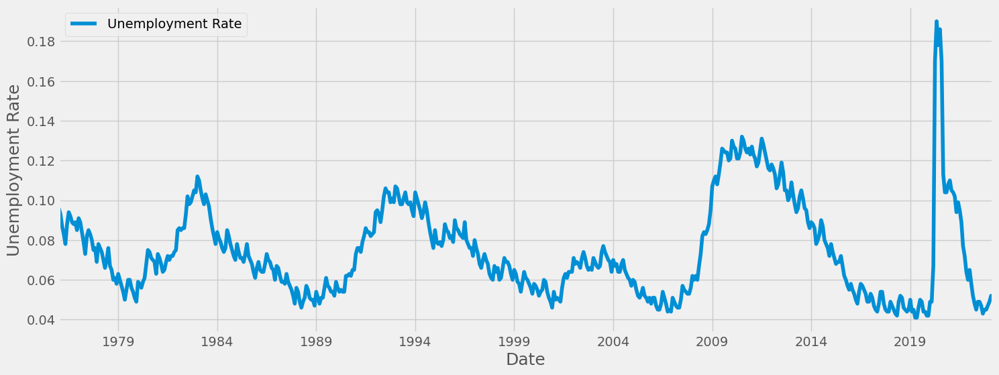

In [ ]:
plot_county(Los_Angeles)

In [ ]:
Los_Angeles['Unemployment Rate'].max()

0.19

Maybe a bit unsurprising but during COVID-19 the unemployment rate in Los Angeles County was 19% <br>

### **Function for county with highest unemployment and time of highest unemployment**
This function is fairly straightforward and will not need a walkthrough of the functionality it provides: for the cities in our dataset what was the highest unemployment rate and when did that happen?
<br>

- Likely we expect most counties to have experienced their highest concentration of unemployment during COVID-19 but there may be some surprising results.

In [ ]:
# Function is fairly straight forward, in the (county) entry enter name of county to get highest
# 'Unemployment Rate'function will also return date of highest unemployment. From there we can do
# a time study of why unemployment was so high during that time in that area.

def U_R(county):
    print('Highest unemployment rate: {}'.format(county['Unemployment Rate'].max()))
    print('Date of highest unemployment: {}'.format(county['Unemployment Rate'].idxmax()))

In [ ]:
U_R(Los_Angeles)

Highest unemployment rate: 0.19
Date of highest unemployment: 2020-05


Great! We have a single diff function. Let's try utilizing this on the remainder of our data. <br>

#### **Los Angeles County Education Level**

As stated above, for each city we will be pulling data from the __[United States Census Bureau](https://www.census.gov/)__
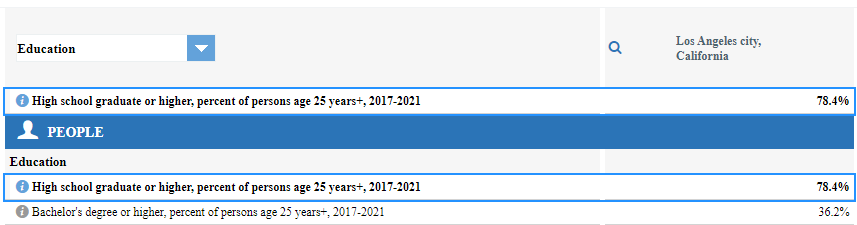 <br>

#### **In consideration of COVID-19**

We anticipate that the pandemic will have altered the unemployment rate of most of the cities in our dataset. That said, we will take unemployment rate data from our most current data, as well as data that has been established prior to the pandemic. For the sake of our analysis we will use the data prior to shelter in place orders in order to get the best representative data.

In [ ]:
# Because we are going to make some predictions on this
# information, let's make a new set of data for city_education
# We will include a binary classifier for unemployment rate
# 0 being outside the pandemic, 1 being in it. The significance
# is that 0 implies that education level is lower than the average
# 1 being above.

LA_edu = {'County': ['Los Angeles'],
                   'High School Grad': [80.9],
                   '4 Year College Degree': [34.0],
                   'Highest Unemployment Rate': [13.2],
                   'Highest UR was during Pandemic': [1],
                   '2017 Census of Agriculture Rank(Crops)': [31]}

county_ed = pd.DataFrame(data = LA_edu)
county_ed.head()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
0,Los Angeles,80.9,34.0,13.2,1,31


Information on the final column in our dataset is from the __[2017 Census of Agriculture County Profile](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06037.pdf)__ on Los Angeles County

### __[Alameda County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06001.pdf)__

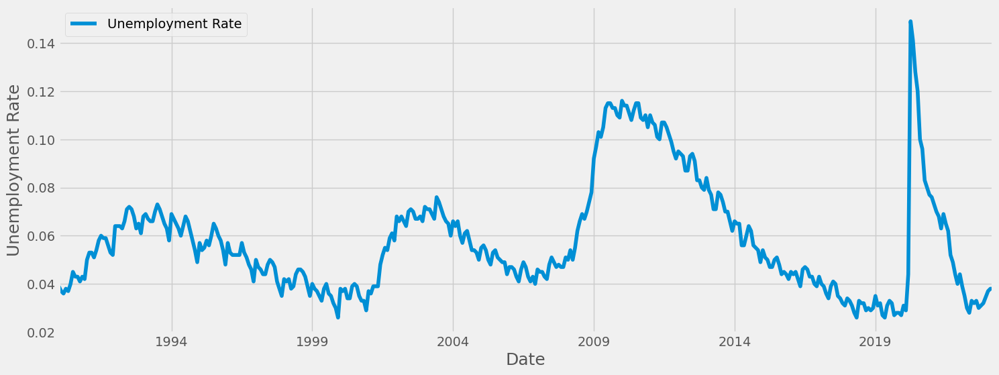

In [ ]:
plot_county(Alameda)

In [ ]:
U_R(Alameda)

Highest unemployment rate: 0.149
Date of highest unemployment: 2020-04


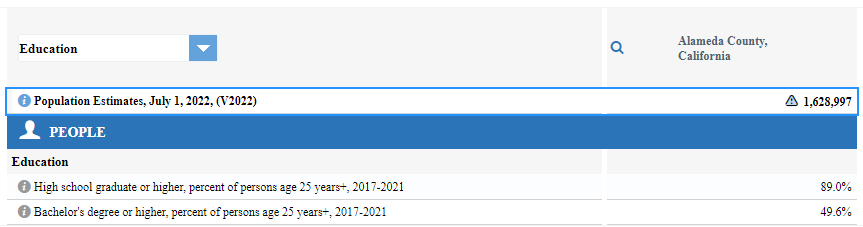 <br>

Alameda county experienced their highest rate of unemployment during the pandemic as well at a rate of 14.9% in 2020.

In [ ]:
Alameda = Alameda.iloc[0:-39]
U_R(Alameda)

Highest unemployment rate: 0.116
Date of highest unemployment: 2010-01


In [ ]:
# Let's add a variable for Alameda County and the information from
# the US Census

# Function to add county information to new table county_edu

def ed(county, high_school, college, unemployment, pandemic, rank):
    county_ed.loc[len(county_ed.index)] = [county,
                                           high_school,
                                           college,
                                           unemployment,
                                           pandemic,
                                           rank
                                           ]

In [ ]:
# Call on the above function and make sure that our 'city'
# entry is entered as a string. We will also only store
# unemplyment rate data prior to 2020's pandemic
ed('Alameda', 89.0, 49.6, 11.5, 1, 41)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
0,Los Angeles,80.9,34.0,13.2,1,31
1,Alameda,89.0,49.6,11.5,1,41


### __[San Bernardino County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06071.pdf)__

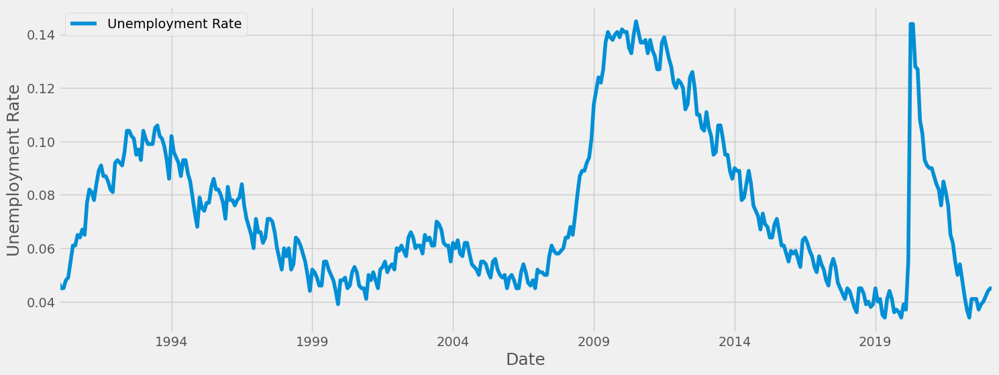

In [ ]:
plot_county(San_Bernardino)

In [ ]:
U_R(San_Bernardino)

Highest unemployment rate: 0.145
Date of highest unemployment: 2010-07


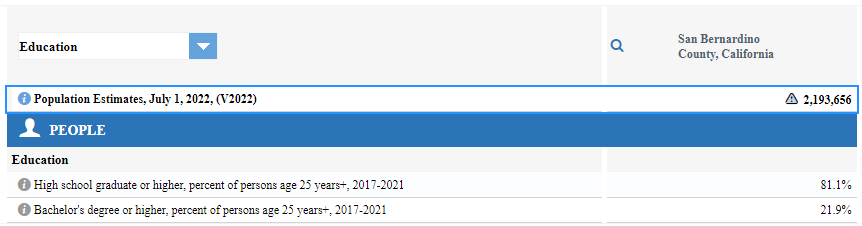 <br>

San Bernardino county experienced their highest rate of unemployment outside of the pandemic, in 2010 it rose to 14.5%.

In [ ]:
ed('San Bernardino', 81.1, 21.9, 14.5, 0, 33)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
0,Los Angeles,80.9,34.0,13.2,1,31
1,Alameda,89.0,49.6,11.5,1,41
2,San Bernardino,81.1,21.9,14.5,0,33


### __[Riverside County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06065.pdf)__

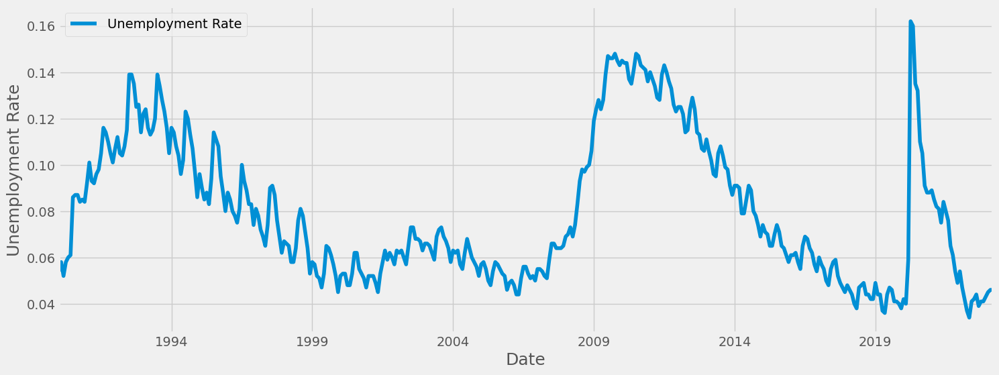

In [ ]:
plot_county(Riverside)

In [ ]:
U_R(Riverside)

Highest unemployment rate: 0.162
Date of highest unemployment: 2020-04


In [ ]:
Riverside = Riverside.iloc[0:-39]
U_R(Riverside)

Highest unemployment rate: 0.148
Date of highest unemployment: 2009-10


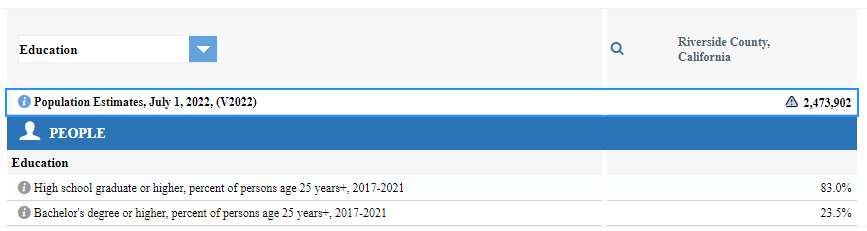 <br>

Riverside County experienced a 16.2% unemployment rate during the quarantine and a 14.8% prior to that in 2009.

In [ ]:
# Call on edu function and input values
ed('Riverside', 83.0, 23.5, 14.8, 1, 14)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
0,Los Angeles,80.9,34.0,13.2,1,31
1,Alameda,89.0,49.6,11.5,1,41
2,San Bernardino,81.1,21.9,14.5,0,33
3,Riverside,83.0,23.5,14.8,1,14


### __[Placer County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06061.pdf)__

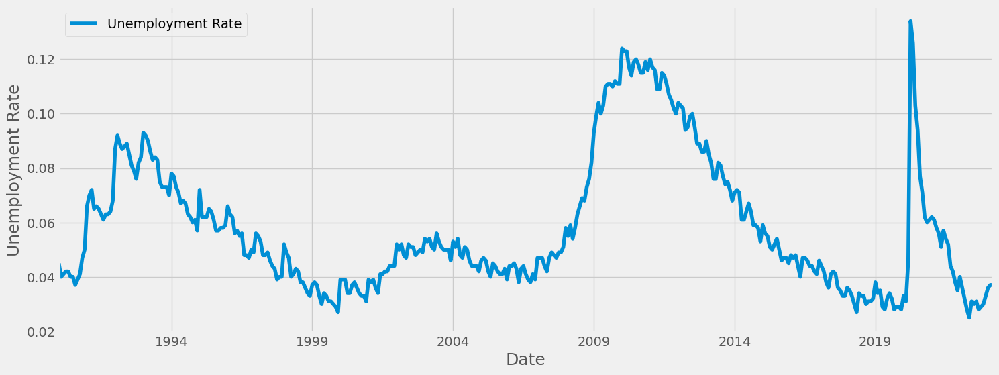

In [ ]:
plot_county(Placer)

In [ ]:
U_R(Placer)

Highest unemployment rate: 0.134
Date of highest unemployment: 2020-04


In [ ]:
Placer = Placer.iloc[0:-38]
U_R(Placer)

Highest unemployment rate: 0.124
Date of highest unemployment: 2010-01


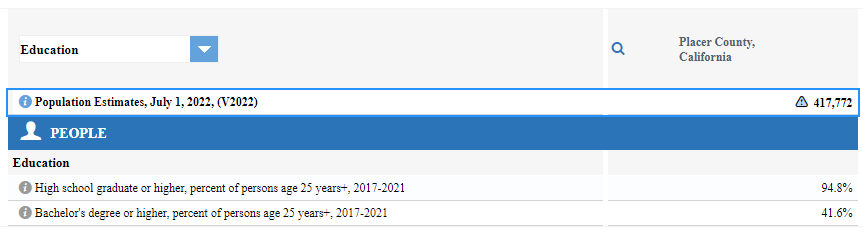 <br>

During the pandemic Placer County's rate of unemployment was 13.4% in 2020 and 12.4% in 2010, prior to the pandemic.

In [ ]:
ed('Placer', 94.8, 41.6, 12.4, 1, 40)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
0,Los Angeles,80.9,34.0,13.2,1,31
1,Alameda,89.0,49.6,11.5,1,41
2,San Bernardino,81.1,21.9,14.5,0,33
3,Riverside,83.0,23.5,14.8,1,14
4,Placer,94.8,41.6,12.4,1,40


### __[Siskiyou County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06093.pdf)__

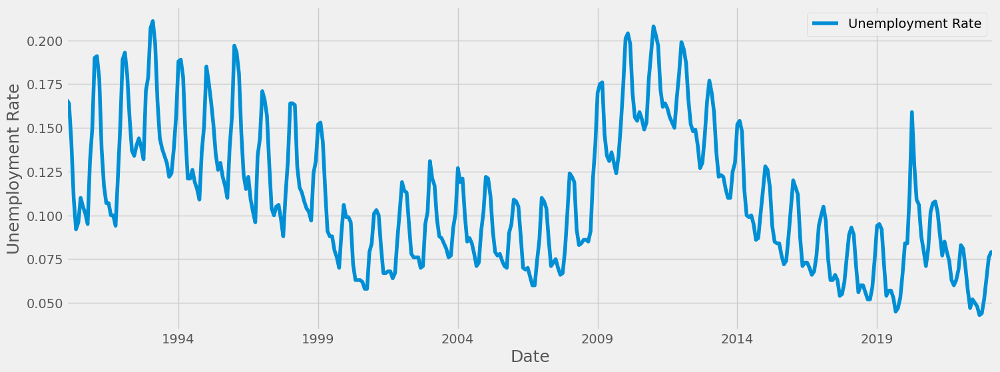

In [ ]:
plot_county(Siskiyou)

In [ ]:
U_R(Siskiyou)

Highest unemployment rate: 0.211
Date of highest unemployment: 1993-02


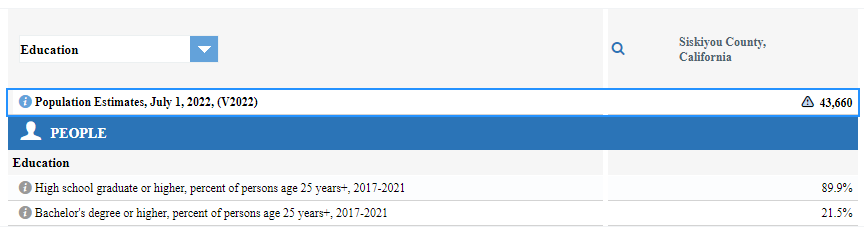<br>

In 1993 Siskiyou County's rate of unemployment hit a high of 21.1%

In [ ]:
ed('Siskiyou', 89.9, 21.5, 21.1, 0, 29)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
1,Alameda,89.0,49.6,11.5,1,41
2,San Bernardino,81.1,21.9,14.5,0,33
3,Riverside,83.0,23.5,14.8,1,14
4,Placer,94.8,41.6,12.4,1,40
5,Siskiyou,89.9,21.5,21.1,0,29


### __[Madera County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06039.pdf)__

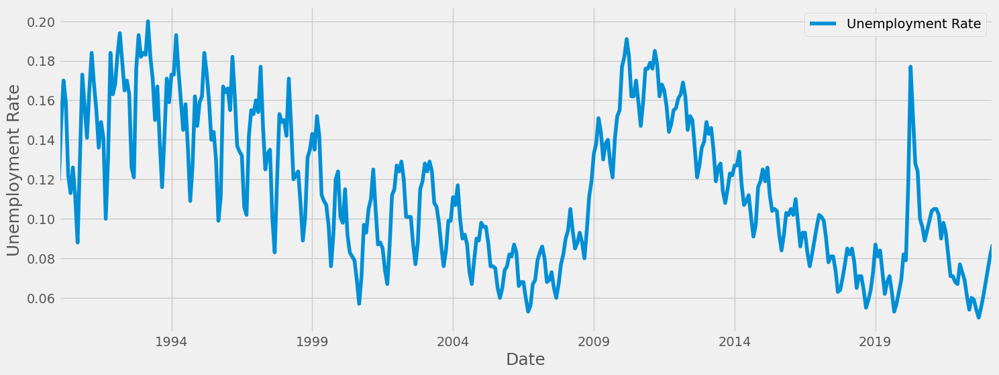

In [ ]:
plot_county(Madera)

In [ ]:
U_R(Madera)

Highest unemployment rate: 0.2
Date of highest unemployment: 1993-03


#### Madera explored

According to the __[Madera County's website](https://centralcalifornia.org/location-advantages/madera-county/)__ "Madera County is home to over 100 manufacturing companies with a high concentration of food manufacturing and packaging facilities. Major operations include: Gallo Winery, Ardagh Glass, Baltimore Aircoil, Certainteed Corp., JBT Food Tech, Evapco West, Warnock Foods, Azteca Milling, Oldcastle Enclosure Solutions and Georgia Pacific. Madera County is also a natural fit for distribution as the geographical center of California." <br>

Madera it would seem also suffered the same ilk that El Centro did during 1992. 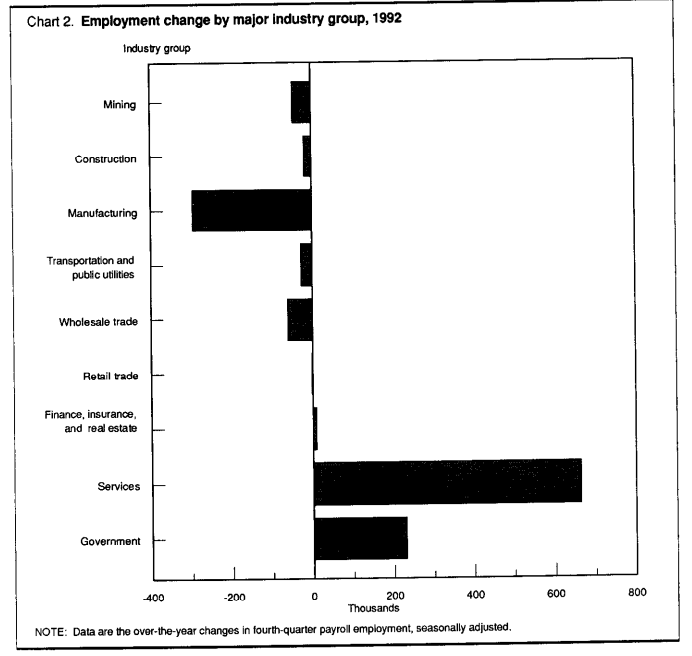<br>

<center>https://www.bls.gov/opub/mlr/1993/02/art1full.pdf, page 7</center> <br>

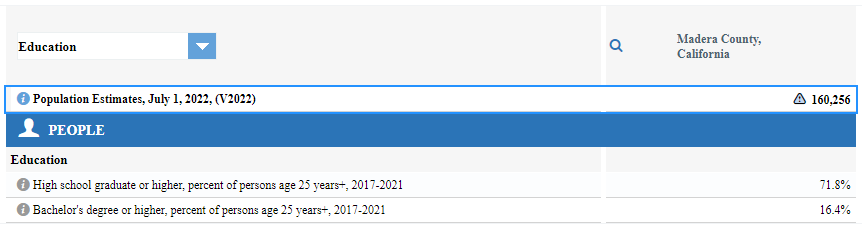

In [ ]:
ed('Madera', 71.8, 16.4, 20.0, 0, 11)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
2,San Bernardino,81.1,21.9,14.5,0,33
3,Riverside,83.0,23.5,14.8,1,14
4,Placer,94.8,41.6,12.4,1,40
5,Siskiyou,89.9,21.5,21.1,0,29
6,Madera,71.8,16.4,20.0,0,11


### __[El Dorado County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06017.pdf)__

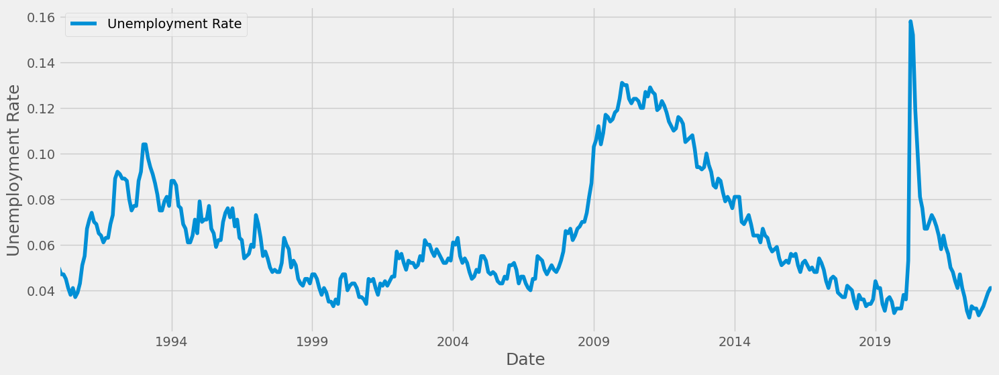

In [ ]:
plot_county(El_Dorado)

In [ ]:
U_R(El_Dorado)

Highest unemployment rate: 0.158
Date of highest unemployment: 2020-04


In [ ]:
El_Dorado = El_Dorado.iloc[0:-38]
U_R(El_Dorado)

Highest unemployment rate: 0.131
Date of highest unemployment: 2010-01


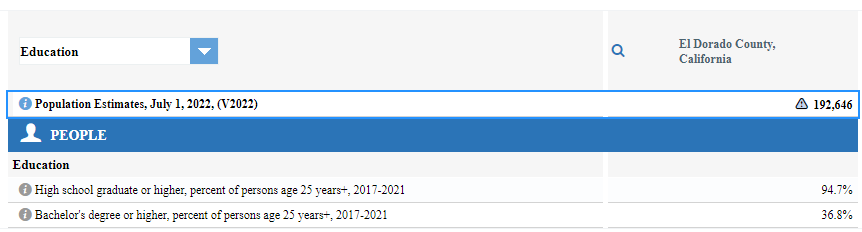 <br>

During the pandemic El Dorado County's rate of unemployment was 15.8%; outside of the pandemic the county's highest rate of unemployment was in 2010 at 13.1%

In [ ]:
ed('El Dorado', 94.7, 36.8, 13.1, 1, 44)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
3,Riverside,83.0,23.5,14.8,1,14
4,Placer,94.8,41.6,12.4,1,40
5,Siskiyou,89.9,21.5,21.1,0,29
6,Madera,71.8,16.4,20.0,0,11
7,El Dorado,94.7,36.8,13.1,1,44


### __[Calaveras County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06009.pdf)__

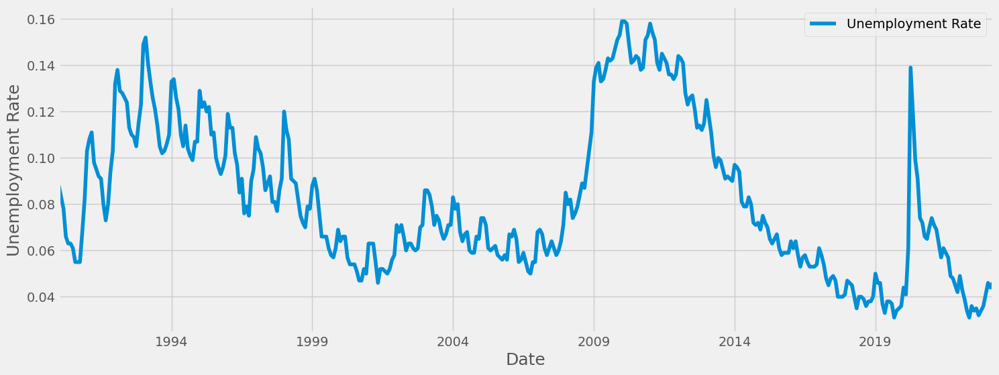

In [ ]:
plot_county(Calaveras)

In [ ]:
U_R(Calaveras)

Highest unemployment rate: 0.159
Date of highest unemployment: 2010-02


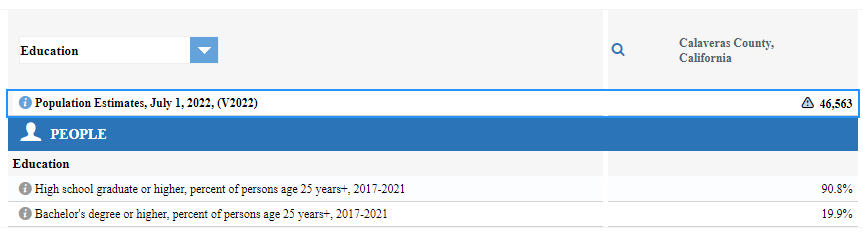<br>

In 2010 Calaveras County's rate of unemployment was 15.9%


In [ ]:
ed('Calaveras', 90.8, 19.9, 15.9, 0, 48)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
4,Placer,94.8,41.6,12.4,1,40
5,Siskiyou,89.9,21.5,21.1,0,29
6,Madera,71.8,16.4,20.0,0,11
7,El Dorado,94.7,36.8,13.1,1,44
8,Calaveras,90.8,19.9,15.9,0,48


### __[Sutter County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06101.pdf)__

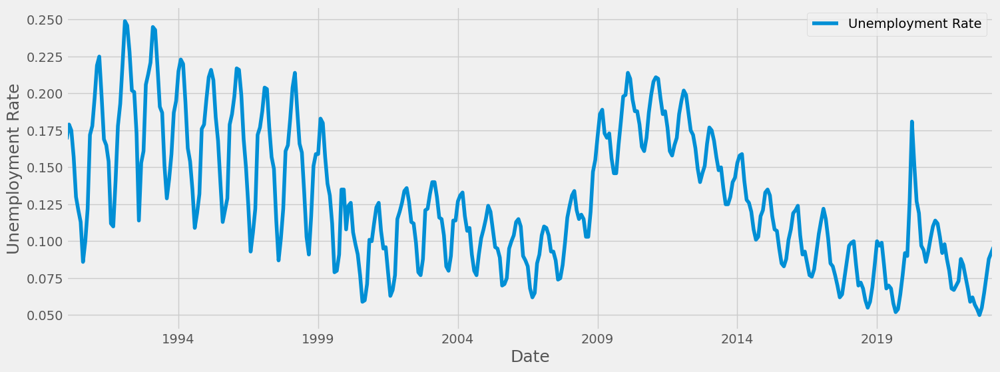

In [ ]:
plot_county(Sutter)

In [ ]:
U_R(Sutter)

Highest unemployment rate: 0.249
Date of highest unemployment: 1992-02


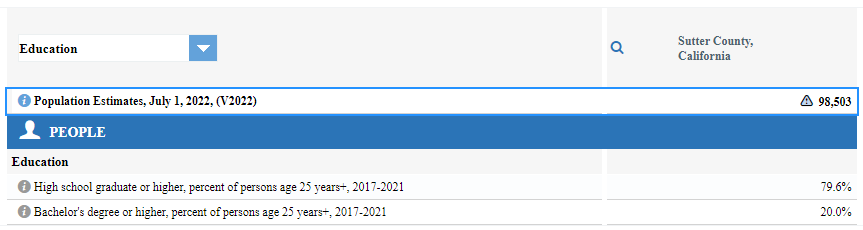 <br>

Sutter County's highest rate of unemployment was in 1992 at 24.9%

In [ ]:
ed('Sutter', 79.6, 20.0, 24.9, 0, 23)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
5,Siskiyou,89.9,21.5,21.1,0,29
6,Madera,71.8,16.4,20.0,0,11
7,El Dorado,94.7,36.8,13.1,1,44
8,Calaveras,90.8,19.9,15.9,0,48
9,Sutter,79.6,20.0,24.9,0,23


### __[Colusa County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06011.pdf)__

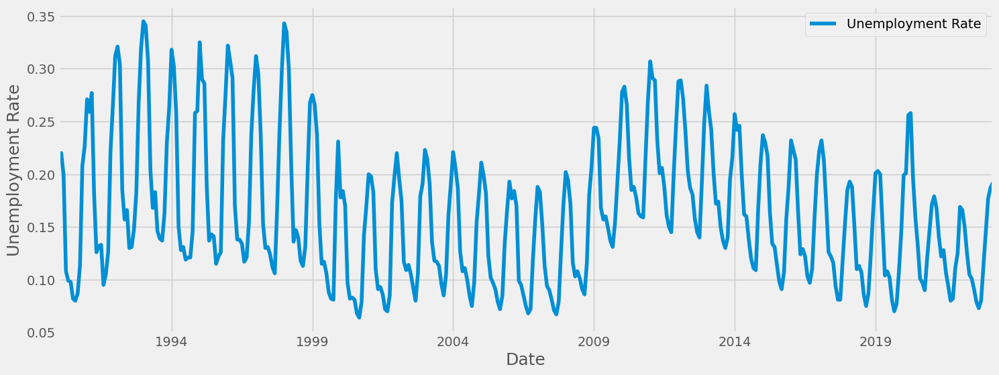

In [ ]:
plot_county(Colusa)

In [ ]:
U_R(Colusa)

Highest unemployment rate: 0.345
Date of highest unemployment: 1993-01


<br>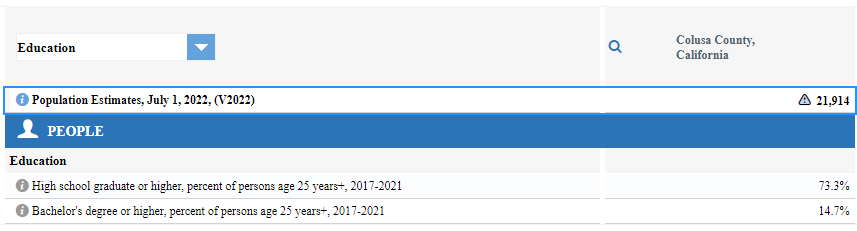<br>

Colusa County's highest rate of unemployment was 34.5% in 1993.

In [ ]:
ed('Colusa', 73.3, 14.7, 34.5, 0, 20)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
6,Madera,71.8,16.4,20.0,0,11
7,El Dorado,94.7,36.8,13.1,1,44
8,Calaveras,90.8,19.9,15.9,0,48
9,Sutter,79.6,20.0,24.9,0,23
10,Colusa,73.3,14.7,34.5,0,20


### __[Butte County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06007.pdf)__

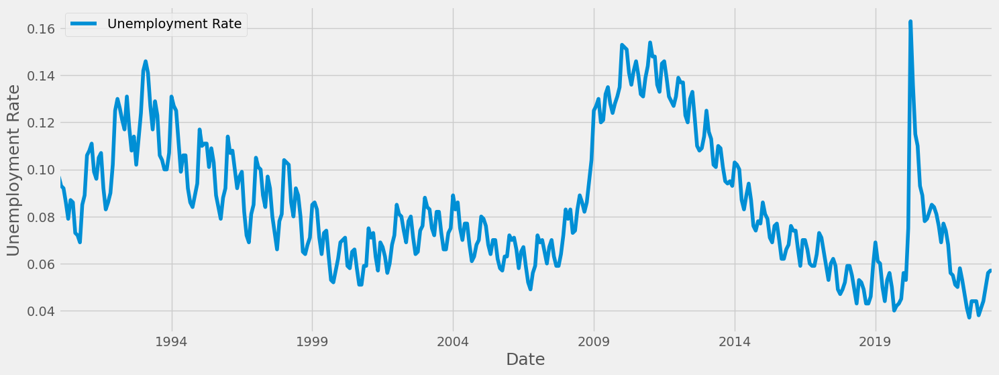

In [ ]:
plot_county(Butte)

In [ ]:
U_R(Butte)

Highest unemployment rate: 0.163
Date of highest unemployment: 2020-04


In [ ]:
Butte = Butte.iloc[0:-38]
U_R(Butte)

Highest unemployment rate: 0.154
Date of highest unemployment: 2011-01


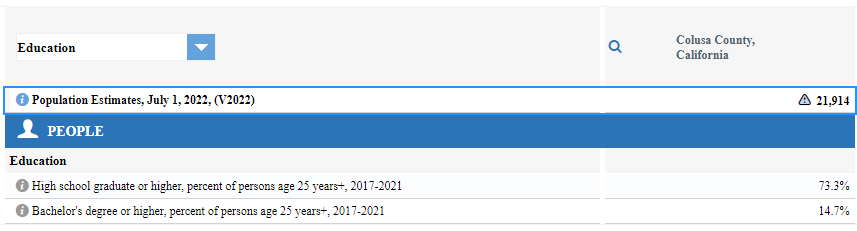 <br>

Butte County experienced their highest rate of unemployment during the pandemic in 2020 at 16.3% but prior to that in 2011 at 15.4%

In [ ]:
ed('Butte', 73.3, 14.7, 15.4, 1, 22)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
7,El Dorado,94.7,36.8,13.1,1,44
8,Calaveras,90.8,19.9,15.9,0,48
9,Sutter,79.6,20.0,24.9,0,23
10,Colusa,73.3,14.7,34.5,0,20
11,Butte,73.3,14.7,15.4,1,22


### __[Lake County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06033.pdf)__

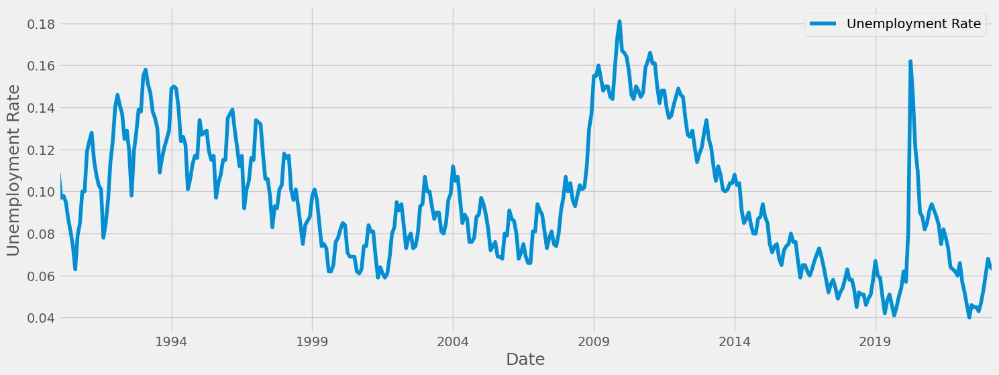

In [ ]:
plot_county(Lake)

In [ ]:
U_R(Lake)

Highest unemployment rate: 0.181
Date of highest unemployment: 2009-12


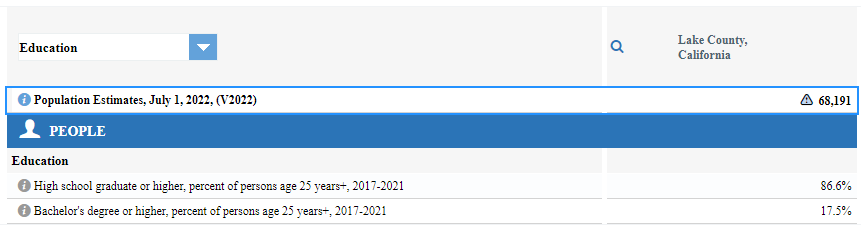 <br>

Lake County experienced their highest rate of unemployment in 2009 at 18.1%

In [ ]:
ed('Lake', 86.6, 17.5, 18.1, 0, 38)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
8,Calaveras,90.8,19.9,15.9,0,48
9,Sutter,79.6,20.0,24.9,0,23
10,Colusa,73.3,14.7,34.5,0,20
11,Butte,73.3,14.7,15.4,1,22
12,Lake,86.6,17.5,18.1,0,38


### __[Yuba County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06115.pdf)__

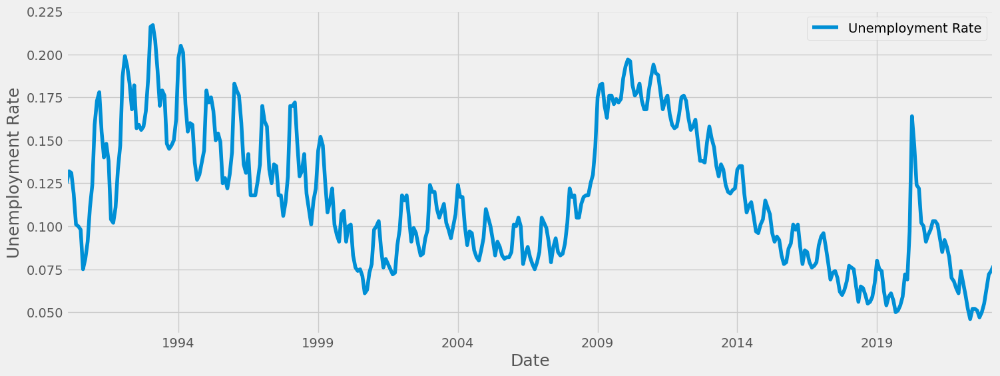

In [ ]:
plot_county(Yuba)

In [ ]:
U_R(Yuba)

Highest unemployment rate: 0.217
Date of highest unemployment: 1993-02


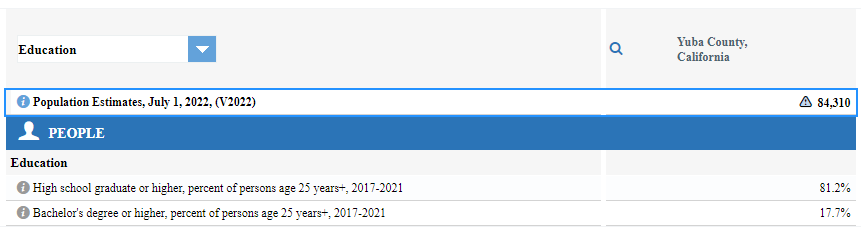<br>

Yuba County experienced a 21.7% rate of unemployment in 1993.

In [ ]:
ed('Yuba', 81.2, 17.7, 21.7, 0, 28)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
9,Sutter,79.6,20.0,24.9,0,23
10,Colusa,73.3,14.7,34.5,0,20
11,Butte,73.3,14.7,15.4,1,22
12,Lake,86.6,17.5,18.1,0,38
13,Yuba,81.2,17.7,21.7,0,28


### __[Del Norte County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06015.pdf)__

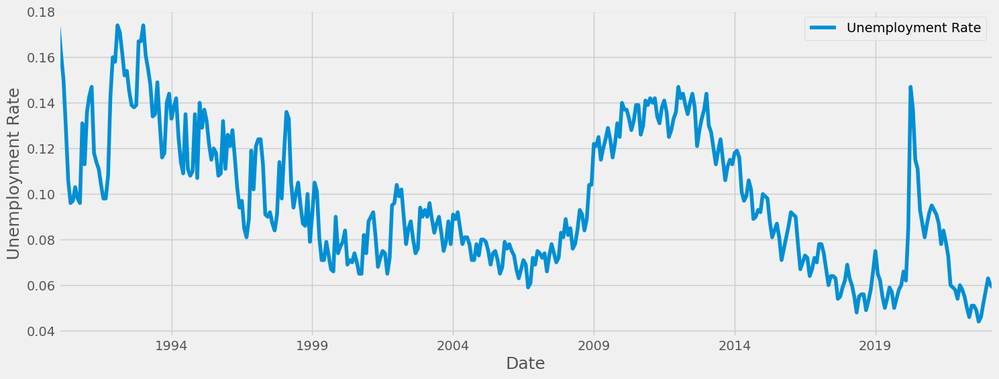

In [ ]:
plot_county(Del_Norte)

In [ ]:
U_R(Del_Norte)

Highest unemployment rate: 0.174
Date of highest unemployment: 1992-02


In 1992 the rate of unemployment was 17.4% in Del Norte County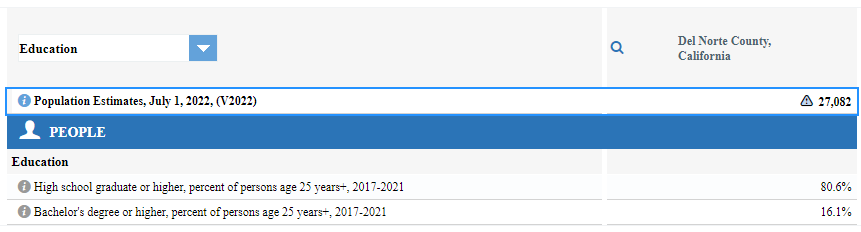

In [ ]:
ed('Del Norte', 80.6, 16.1, 17.4, 0, 46)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
10,Colusa,73.3,14.7,34.5,0,20
11,Butte,73.3,14.7,15.4,1,22
12,Lake,86.6,17.5,18.1,0,38
13,Yuba,81.2,17.7,21.7,0,28
14,Del Norte,80.6,16.1,17.4,0,46


### __[Yolo County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06113.pdf)__

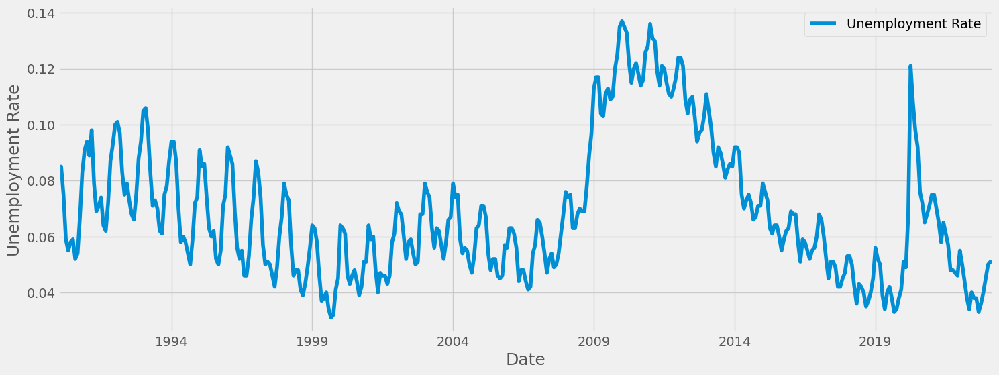

In [ ]:
plot_county(Yolo)

In [ ]:
U_R(Yolo)

Highest unemployment rate: 0.137
Date of highest unemployment: 2010-01


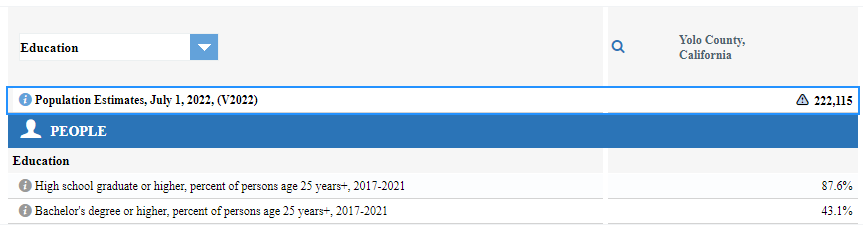 <br>

Yolo County experienced a 13.7% rate of unemployment in 2010.

In [ ]:
ed('Yolo', 87.6, 43.1, 13.7, 0, 19)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
11,Butte,73.3,14.7,15.4,1,22
12,Lake,86.6,17.5,18.1,0,38
13,Yuba,81.2,17.7,21.7,0,28
14,Del Norte,80.6,16.1,17.4,0,46
15,Yolo,87.6,43.1,13.7,0,19


### __[San Diego County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06073.pdf)__

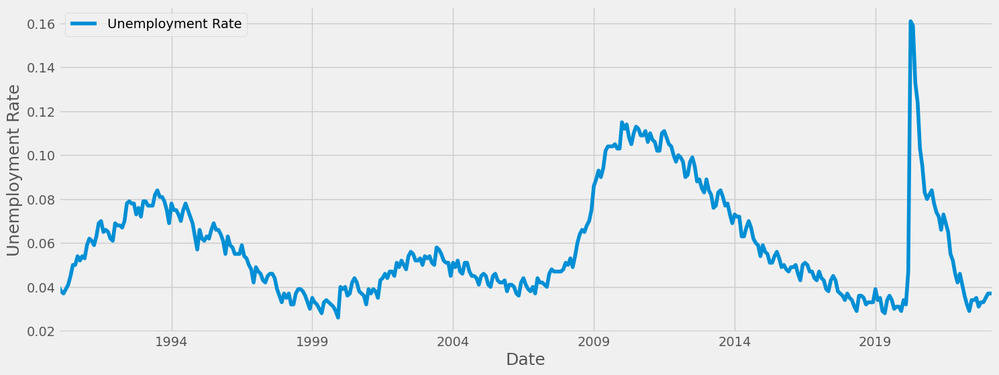

In [ ]:
plot_county(San_Diego)

In [ ]:
U_R(San_Diego)

Highest unemployment rate: 0.161
Date of highest unemployment: 2020-04


In [ ]:
San_Diego = San_Diego.iloc[0:-38]
U_R(San_Diego)

Highest unemployment rate: 0.115
Date of highest unemployment: 2010-01


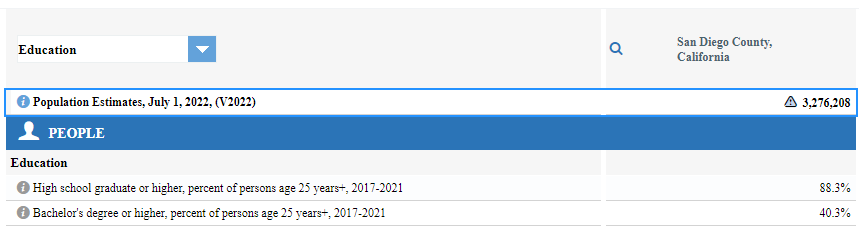<br>

San Diego County experienced their highest rate of unemployment during the pandemic in 2020 at 16.1%, outside of the pandemic they experienced an 11.5% in 2010.


In [ ]:
ed('San Diego', 88.3, 40.3, 11.5, 1, 13)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
12,Lake,86.6,17.5,18.1,0,38
13,Yuba,81.2,17.7,21.7,0,28
14,Del Norte,80.6,16.1,17.4,0,46
15,Yolo,87.6,43.1,13.7,0,19
16,San Diego,88.3,40.3,11.5,1,13


### __[Humboldt County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06023.pdf)__

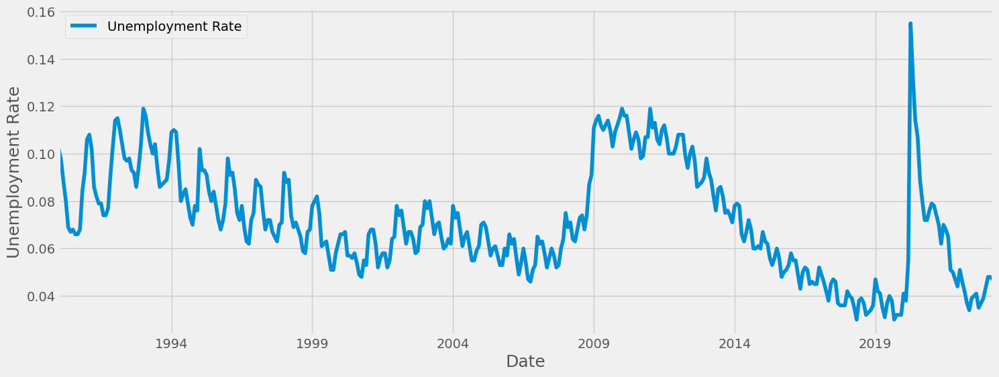

In [ ]:
plot_county(Humboldt)

In [ ]:
U_R(Humboldt)

Highest unemployment rate: 0.155
Date of highest unemployment: 2020-04


In [ ]:
Humboldt = Humboldt.iloc[0:-39]
U_R(Humboldt)

Highest unemployment rate: 0.119
Date of highest unemployment: 1993-01


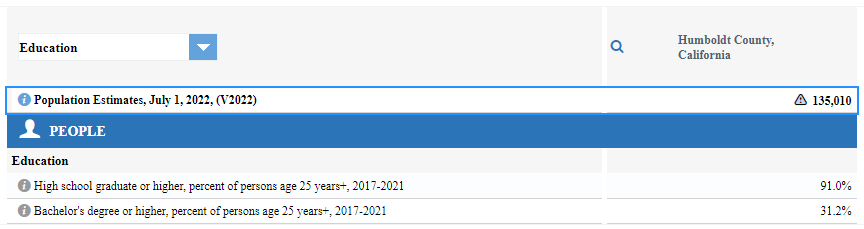 <br>

In 2020 Humboldt County had a rate of unemployment at 15.5% in 2020 and 11.9% in 1993.

In [ ]:
ed('Humboldt', 91.0, 31.2, 11.9, 1, 36)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
13,Yuba,81.2,17.7,21.7,0,28
14,Del Norte,80.6,16.1,17.4,0,46
15,Yolo,87.6,43.1,13.7,0,19
16,San Diego,88.3,40.3,11.5,1,13
17,Humboldt,91.0,31.2,11.9,1,36


### __[Amador County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06005.pdf)__

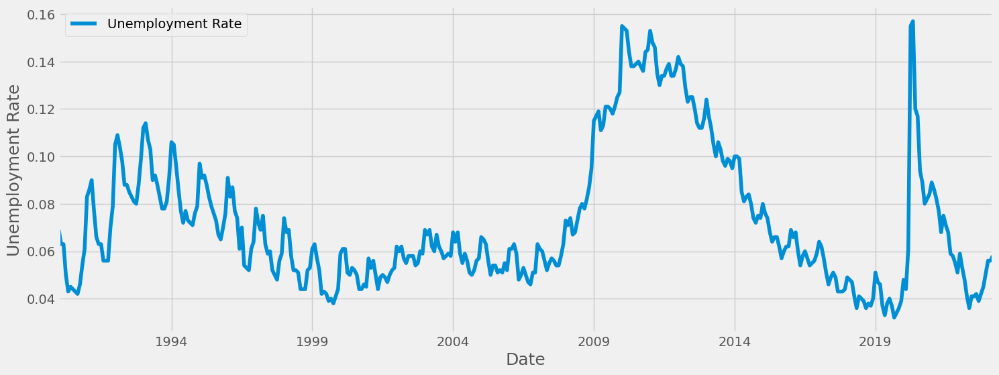

In [ ]:
plot_county(Amador)

In [ ]:
U_R(Amador)

Highest unemployment rate: 0.157
Date of highest unemployment: 2020-05


In [ ]:
Amador = Amador.iloc[0:-38]
U_R(Amador)

Highest unemployment rate: 0.155
Date of highest unemployment: 2010-01


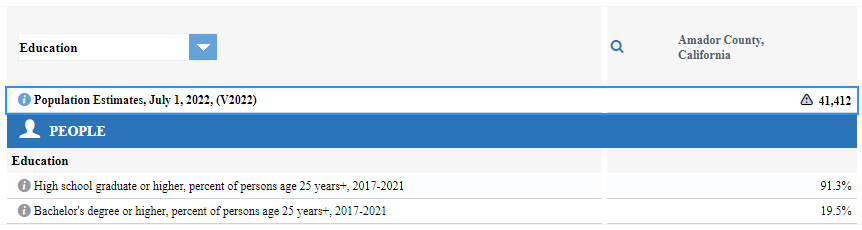<br>

Amador County experienced their highest rate of unemployment in 2020 at 15.7, but nearly an identical rate of 15.5% in 2010.

In [ ]:
ed('Amador', 91.3, 19.5, 15.5, 1, 42)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
14,Del Norte,80.6,16.1,17.4,0,46
15,Yolo,87.6,43.1,13.7,0,19
16,San Diego,88.3,40.3,11.5,1,13
17,Humboldt,91.0,31.2,11.9,1,36
18,Amador,91.3,19.5,15.5,1,42


### __[Glenn County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06021.pdf)__

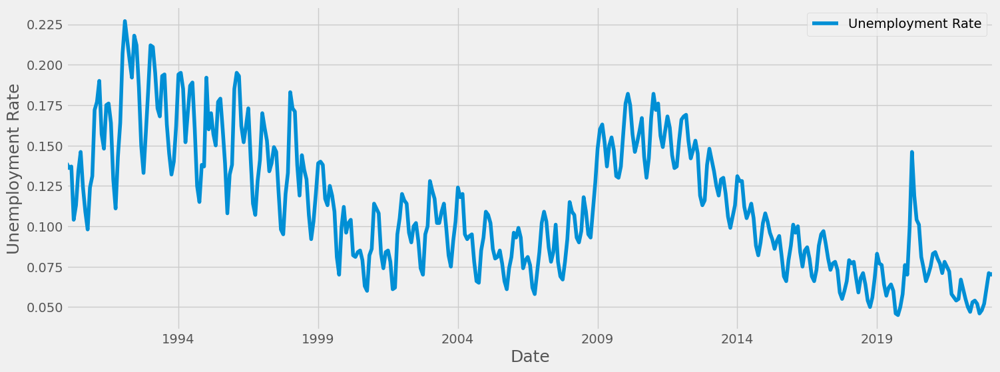

In [ ]:
plot_county(Glenn)

In [ ]:
U_R(Glenn)

Highest unemployment rate: 0.227
Date of highest unemployment: 1992-02


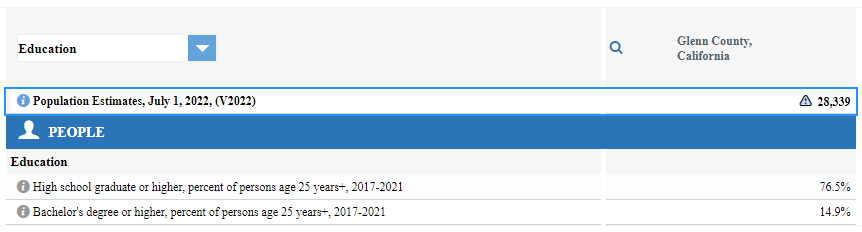 <br>

Glenn County experienced their highest rate of unemployment in 1992 at 22.7%

In [ ]:
ed('Glenn', 76.5, 14.9, 22.7, 0, 21)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
15,Yolo,87.6,43.1,13.7,0,19
16,San Diego,88.3,40.3,11.5,1,13
17,Humboldt,91.0,31.2,11.9,1,36
18,Amador,91.3,19.5,15.5,1,42
19,Glenn,76.5,14.9,22.7,0,21


### __[Mono County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06051.pdf)__

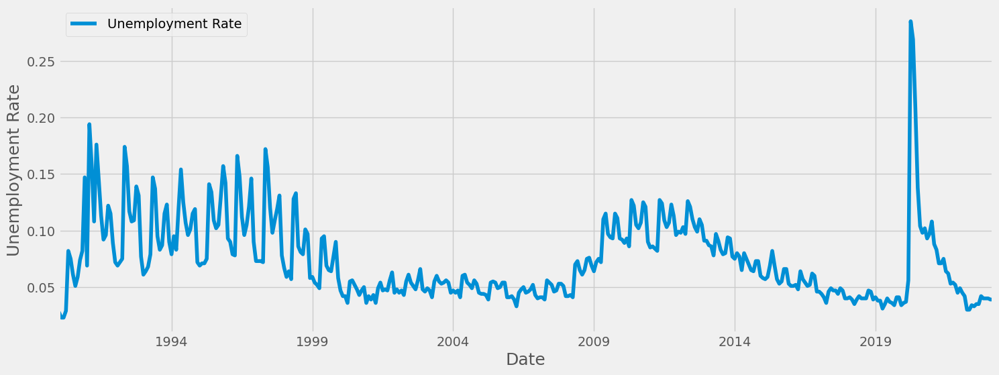

In [ ]:
plot_county(Mono)

In [ ]:
U_R(Mono)

Highest unemployment rate: 0.285
Date of highest unemployment: 2020-04


In [ ]:
Mono = Mono.iloc[0:-38]
U_R(Mono)

Highest unemployment rate: 0.194
Date of highest unemployment: 1991-02


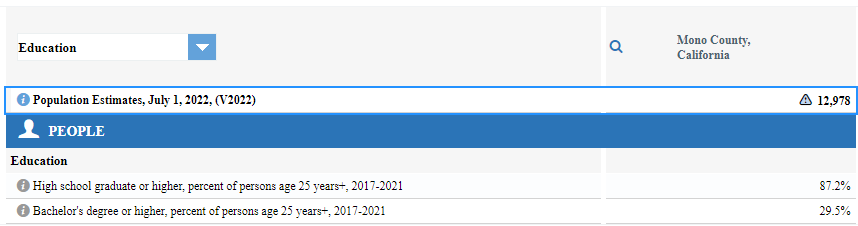 <br>

Mono County experienced their highest rate of unemployment during the pandemic at 28.5% and in 1991 at 19.4%.

In [ ]:
ed('Mono', 87.2, 29.5, 19.4, 1, 50)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
16,San Diego,88.3,40.3,11.5,1,13
17,Humboldt,91.0,31.2,11.9,1,36
18,Amador,91.3,19.5,15.5,1,42
19,Glenn,76.5,14.9,22.7,0,21
20,Mono,87.2,29.5,19.4,1,50


### __[Ventura County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06111.pdf)__

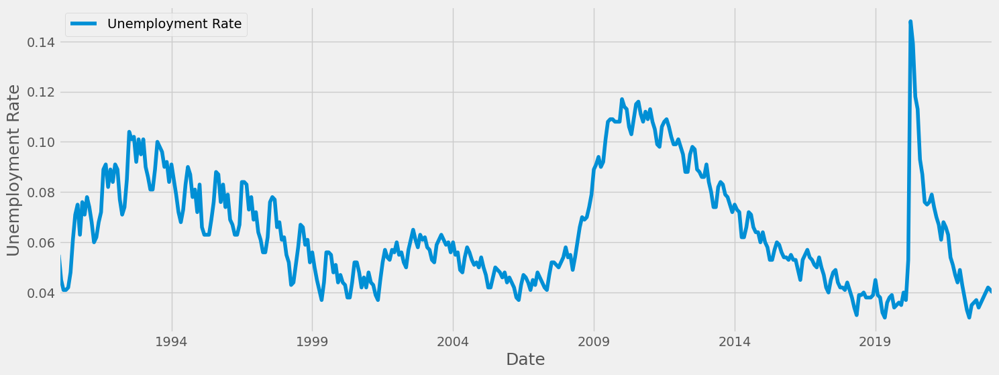

In [ ]:
plot_county(Ventura)

In [ ]:
U_R(Ventura)

Highest unemployment rate: 0.148
Date of highest unemployment: 2020-04


In [ ]:
Ventura = Ventura.iloc[0:-38]
U_R(Ventura)

Highest unemployment rate: 0.117
Date of highest unemployment: 2010-01


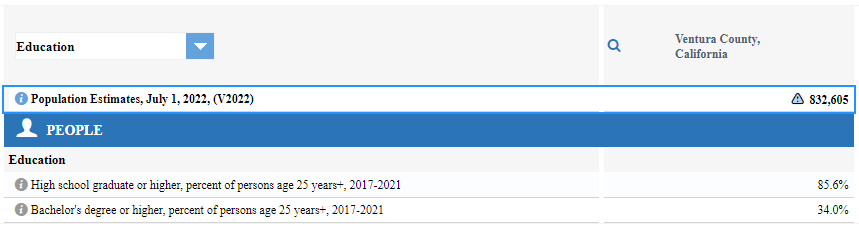 <br>

Ventura county experience their highest rate of unemployment in 2020 at 14.8% and again in 2010 at 11.7%.

In [ ]:
ed('Ventura', 85.6, 34.0, 11.7, 1, 6)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
17,Humboldt,91.0,31.2,11.9,1,36
18,Amador,91.3,19.5,15.5,1,42
19,Glenn,76.5,14.9,22.7,0,21
20,Mono,87.2,29.5,19.4,1,50
21,Ventura,85.6,34.0,11.7,1,6


### __[Plumas County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06063.pdf)__

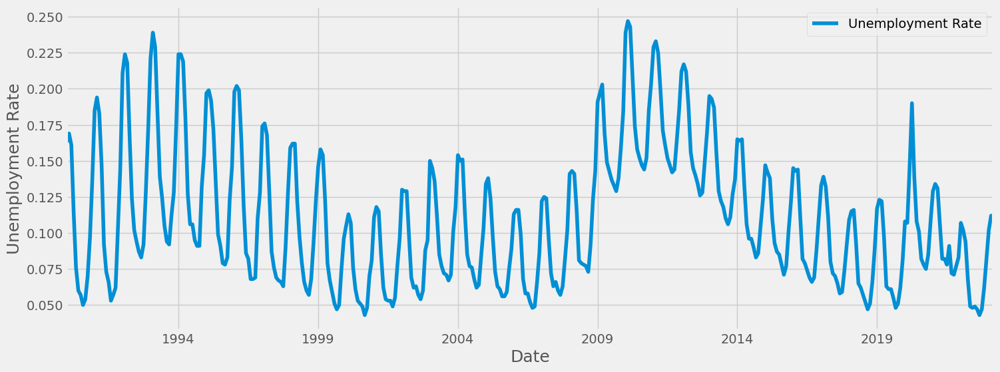

In [ ]:
plot_county(Plumas)

In [ ]:
U_R(Plumas)

Highest unemployment rate: 0.247
Date of highest unemployment: 2010-02


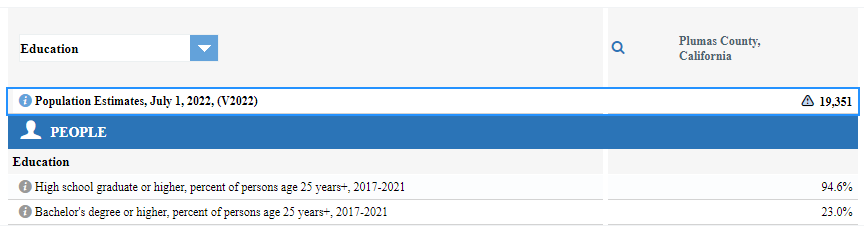<br>

Plumas County experienced their highest rate of unemployment in 2010 at 24.7%

In [ ]:
ed('Plumas', 94.6, 23.0, 24.7, 0, 51)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
18,Amador,91.3,19.5,15.5,1,42
19,Glenn,76.5,14.9,22.7,0,21
20,Mono,87.2,29.5,19.4,1,50
21,Ventura,85.6,34.0,11.7,1,6
22,Plumas,94.6,23.0,24.7,0,51


### __[Solano County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06095.pdf)__

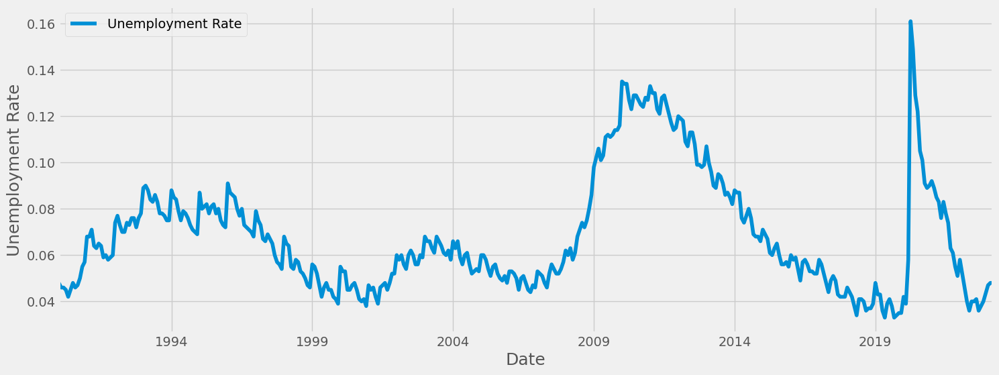

In [ ]:
plot_county(Solano)

In [ ]:
U_R(Solano)

Highest unemployment rate: 0.161
Date of highest unemployment: 2020-04


In [ ]:
Solano = Solano.iloc[0:-38]
U_R(Solano)

Highest unemployment rate: 0.135
Date of highest unemployment: 2010-01


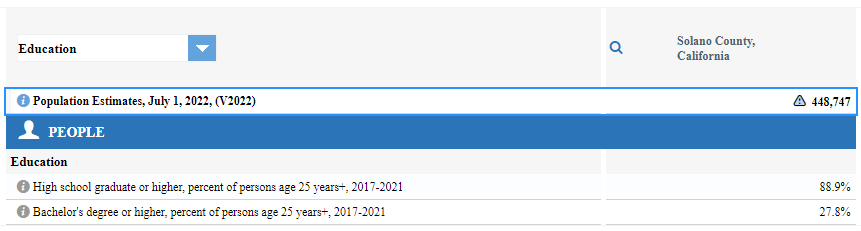<br>

Solano County's highest rate of unemployment was during the pandemic, their second highest was in 2010 at 13.5%

In [ ]:
ed('Solano', 88.9, 27.8, 13.5, 1, 26)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
19,Glenn,76.5,14.9,22.7,0,21
20,Mono,87.2,29.5,19.4,1,50
21,Ventura,85.6,34.0,11.7,1,6
22,Plumas,94.6,23.0,24.7,0,51
23,Solano,88.9,27.8,13.5,1,26


### __[Napa County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06055.pdf)__

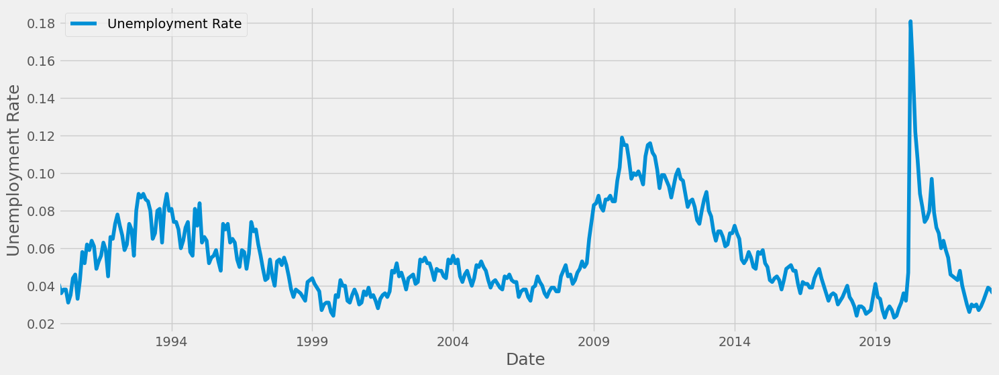

In [ ]:
plot_county(Napa)

In [ ]:
U_R(Napa)

Highest unemployment rate: 0.181
Date of highest unemployment: 2020-04


In [ ]:
Napa = Napa.iloc[0:-38]
U_R(Napa)

Highest unemployment rate: 0.119
Date of highest unemployment: 2010-01


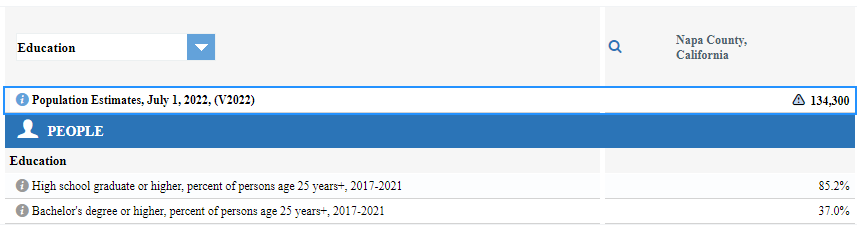 <br>

Napa County experienced their highest rate of unemployment during the pandemic and their second highest in 2010 at 11.9%

In [ ]:
ed('Napa', 85.2, 37.0, 11.9, 1, 18)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
20,Mono,87.2,29.5,19.4,1,50
21,Ventura,85.6,34.0,11.7,1,6
22,Plumas,94.6,23.0,24.7,0,51
23,Solano,88.9,27.8,13.5,1,26
24,Napa,85.2,37.0,11.9,1,18


### __[San Luis Obispo County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06079.pdf)__

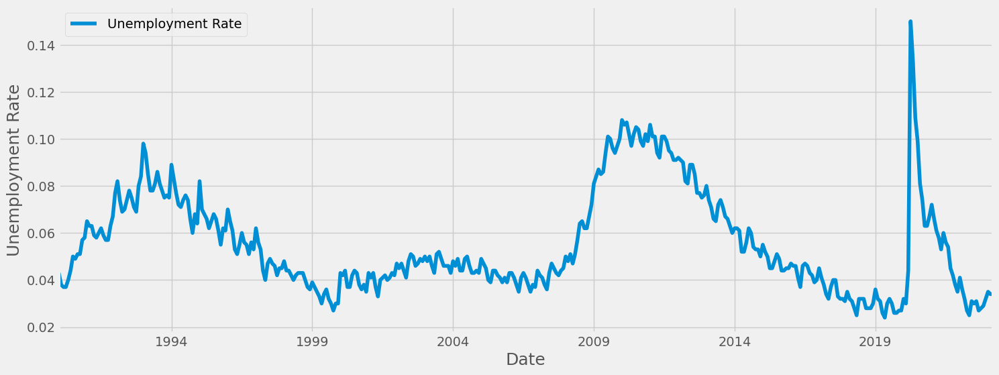

In [ ]:
plot_county(San_Luis_Obispo)

In [ ]:
U_R(San_Luis_Obispo)

Highest unemployment rate: 0.15
Date of highest unemployment: 2020-04


In [ ]:
San_Luis_Obispo = San_Luis_Obispo.iloc[0:-38]
U_R(San_Luis_Obispo)

Highest unemployment rate: 0.108
Date of highest unemployment: 2010-01


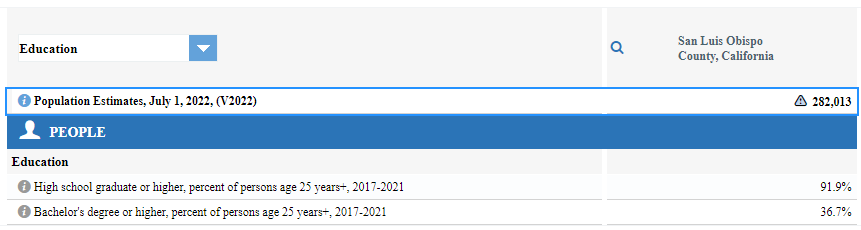 <br>

SLO County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 10.8%

In [ ]:
ed('San Luis Obispo', 91.9, 36.7, 10.8, 1, 15)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
21,Ventura,85.6,34.0,11.7,1,6
22,Plumas,94.6,23.0,24.7,0,51
23,Solano,88.9,27.8,13.5,1,26
24,Napa,85.2,37.0,11.9,1,18
25,San Luis Obispo,91.9,36.7,10.8,1,15


### __[Tuolumne County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06109.pdf)__

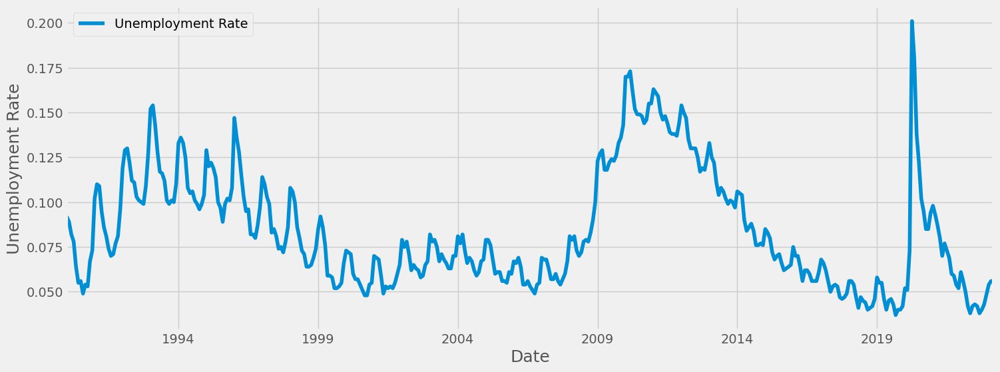

In [ ]:
plot_county(Tuolumne)

In [ ]:
U_R(Tuolumne)

Highest unemployment rate: 0.201
Date of highest unemployment: 2020-04


In [ ]:
Tuolumne = Tuolumne.iloc[0:-38]
U_R(Tuolumne)

Highest unemployment rate: 0.173
Date of highest unemployment: 2010-03


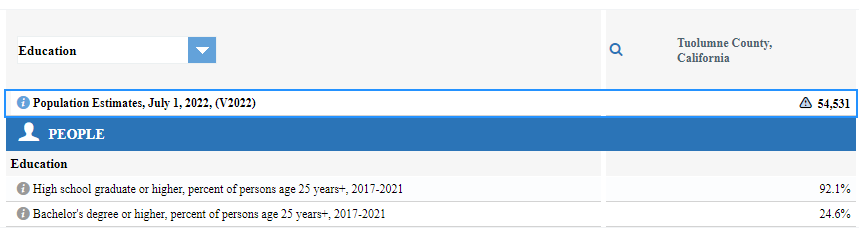 <br>

Tuolumne County experienced their highest rate of unemployment in the pandemic and their second in 2010 at 17.3%


In [ ]:
ed('Tuolumne', 92.1, 24.6, 17.3, 1, 54)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
22,Plumas,94.6,23.0,24.7,0,51
23,Solano,88.9,27.8,13.5,1,26
24,Napa,85.2,37.0,11.9,1,18
25,San Luis Obispo,91.9,36.7,10.8,1,15
26,Tuolumne,92.1,24.6,17.3,1,54


### __[Alpine County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06003.pdf)__

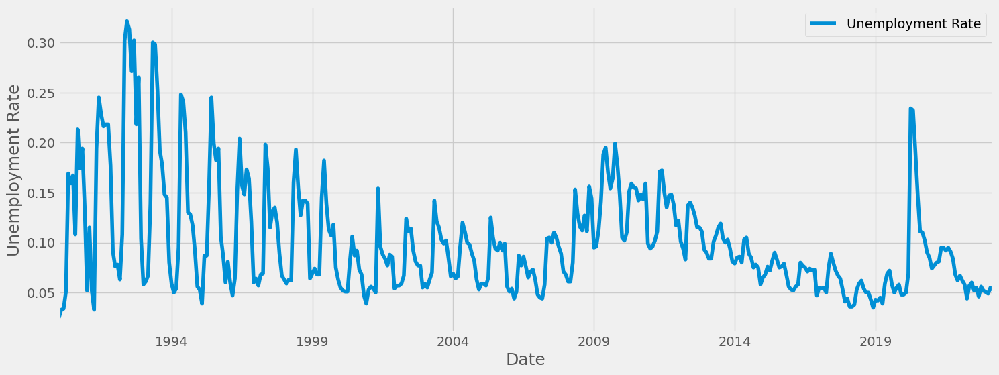

In [ ]:
plot_county(Alpine)

In [ ]:
U_R(Alpine)

Highest unemployment rate: 0.321
Date of highest unemployment: 1992-06


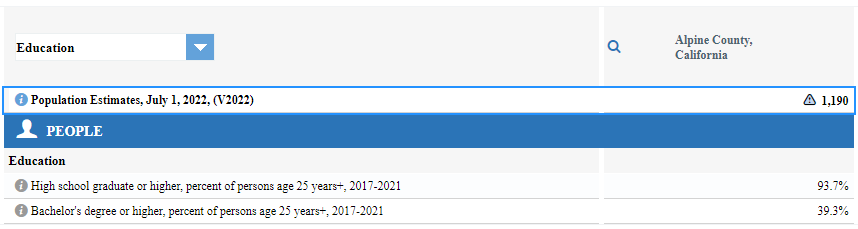 <br>

Alpine County experienced their highest rate of unemployement in 1992 at 32.1%

In [ ]:
ed('Alpine', 93.7, 39.3, 32.1, 0, 58)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
23,Solano,88.9,27.8,13.5,1,26
24,Napa,85.2,37.0,11.9,1,18
25,San Luis Obispo,91.9,36.7,10.8,1,15
26,Tuolumne,92.1,24.6,17.3,1,54
27,Alpine,93.7,39.3,32.1,0,58


### __[Sierra County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06091.pdf)__

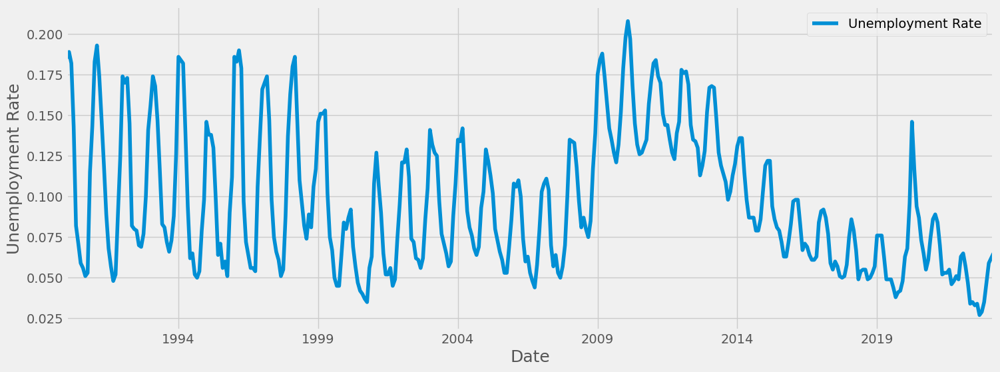

In [ ]:
plot_county(Sierra)

In [ ]:
U_R(Sierra)

Highest unemployment rate: 0.208
Date of highest unemployment: 2010-02


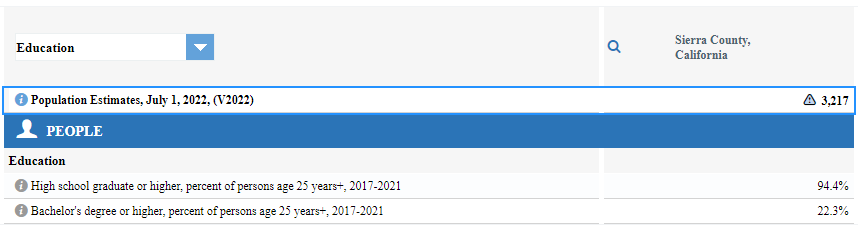<br>

SLO County experienced their highest rate of unemployement in 2010 at 20.8%

In [ ]:
ed('Sierra', 94.4, 22.3, 20.8, 0, 56)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
24,Napa,85.2,37.0,11.9,1,18
25,San Luis Obispo,91.9,36.7,10.8,1,15
26,Tuolumne,92.1,24.6,17.3,1,54
27,Alpine,93.7,39.3,32.1,0,58
28,Sierra,94.4,22.3,20.8,0,56


### __[Tehama County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06103.pdf)__

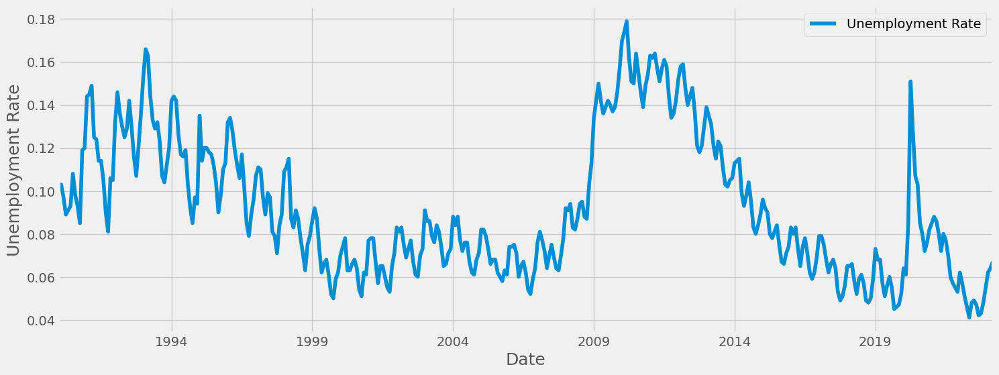

In [ ]:
plot_county(Tehama)

In [ ]:
U_R(Tehama)

Highest unemployment rate: 0.179
Date of highest unemployment: 2010-03


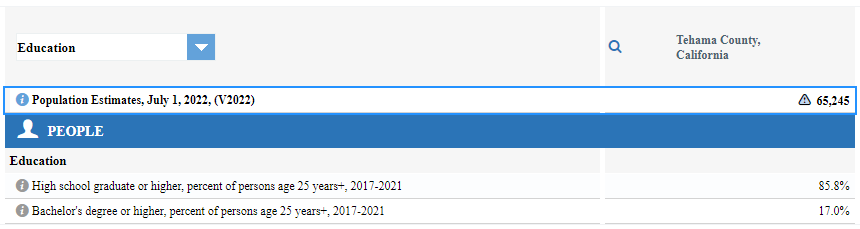 <br>

Tehama County experienced their highest rate of unemployement in 2010 at 17.9%

In [ ]:
ed('Tehama', 85.8, 17.0, 17.9, 0, 29)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
25,San Luis Obispo,91.9,36.7,10.8,1,15
26,Tuolumne,92.1,24.6,17.3,1,54
27,Alpine,93.7,39.3,32.1,0,58
28,Sierra,94.4,22.3,20.8,0,56
29,Tehama,85.8,17.0,17.9,0,29


### __[Marin County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06041.pdf)__

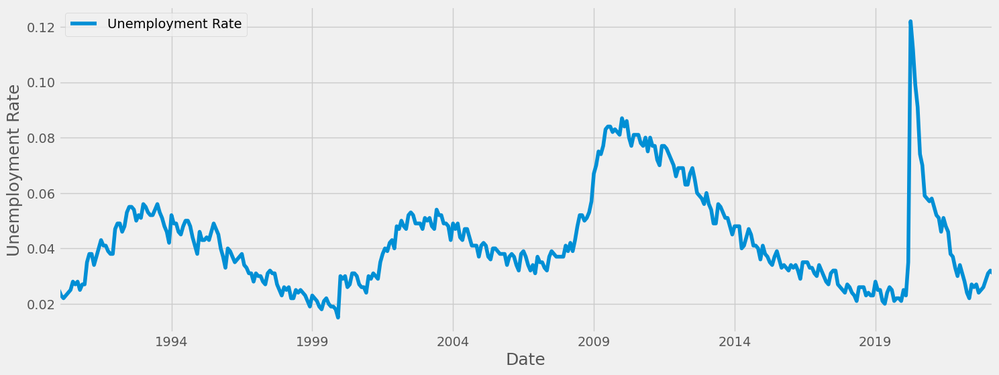

In [ ]:
plot_county(Marin)

In [ ]:
U_R(Marin)

Highest unemployment rate: 0.122
Date of highest unemployment: 2020-04


In [ ]:
Marin = Marin.iloc[0:-38]
U_R(Marin)

Highest unemployment rate: 0.087
Date of highest unemployment: 2010-01


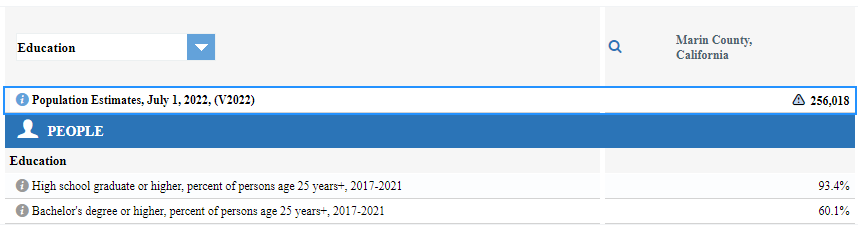 <br>

Marin County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 8.7%

In [ ]:
ed('Marin', 93.4, 60.1, 8.7, 1, 47)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
26,Tuolumne,92.1,24.6,17.3,1,54
27,Alpine,93.7,39.3,32.1,0,58
28,Sierra,94.4,22.3,20.8,0,56
29,Tehama,85.8,17.0,17.9,0,29
30,Marin,93.4,60.1,8.7,1,47


### __[Trinity County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06105.pdf)__

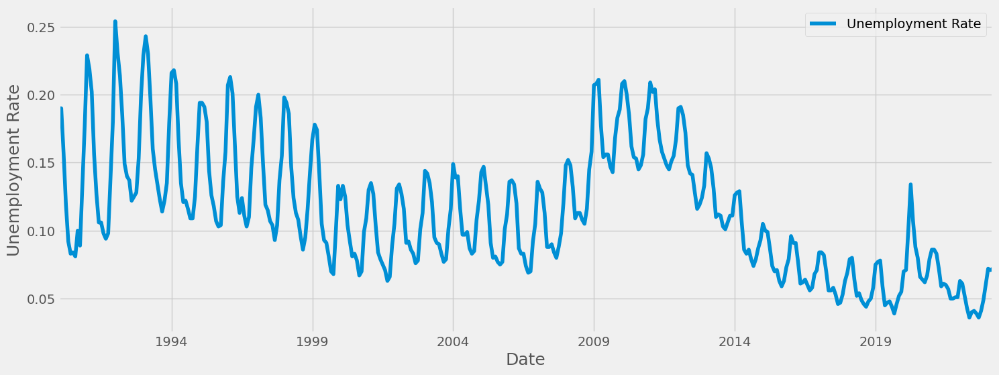

In [ ]:
plot_county(Trinity)

In [ ]:
U_R(Trinity)

Highest unemployment rate: 0.254
Date of highest unemployment: 1992-01


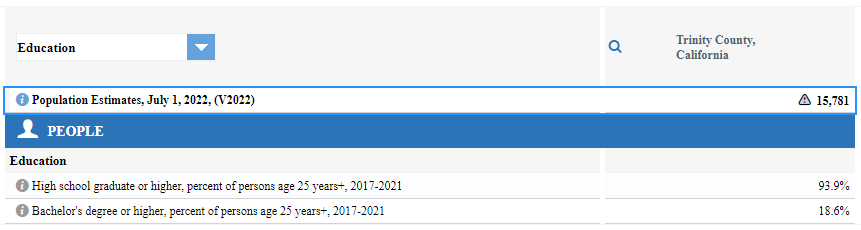 <br>

Trinity County experienced their highest rate of unemployement in 1992 at 25.4%

In [ ]:
ed('Trinity', 93.9, 18.6, 25.4, 0, 55)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
27,Alpine,93.7,39.3,32.1,0,58
28,Sierra,94.4,22.3,20.8,0,56
29,Tehama,85.8,17.0,17.9,0,29
30,Marin,93.4,60.1,8.7,1,47
31,Trinity,93.9,18.6,25.4,0,55


### __[Monterey County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06053.pdf)__

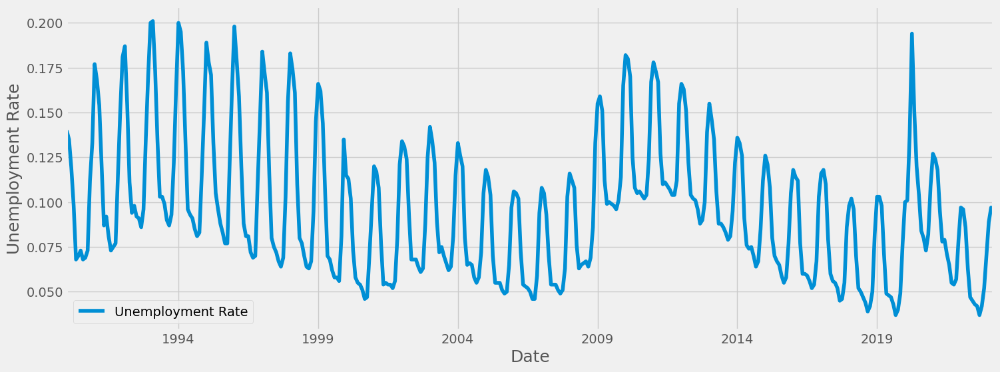

In [ ]:
plot_county(Monterey)

In [ ]:
U_R(Monterey)

Highest unemployment rate: 0.201
Date of highest unemployment: 1993-02


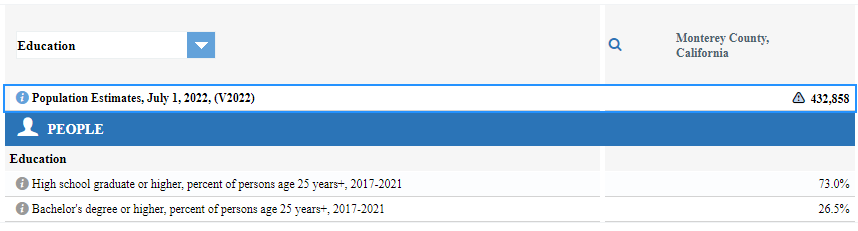 <br>

Monterey County experienced their highest rate of unemployement in 1993 at 20.1%

In [ ]:
ed('Monterey', 73.0, 26.5, 20.1, 0, 2)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
28,Sierra,94.4,22.3,20.8,0,56
29,Tehama,85.8,17.0,17.9,0,29
30,Marin,93.4,60.1,8.7,1,47
31,Trinity,93.9,18.6,25.4,0,55
32,Monterey,73.0,26.5,20.1,0,2


### __[Orange County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06059.pdf)__

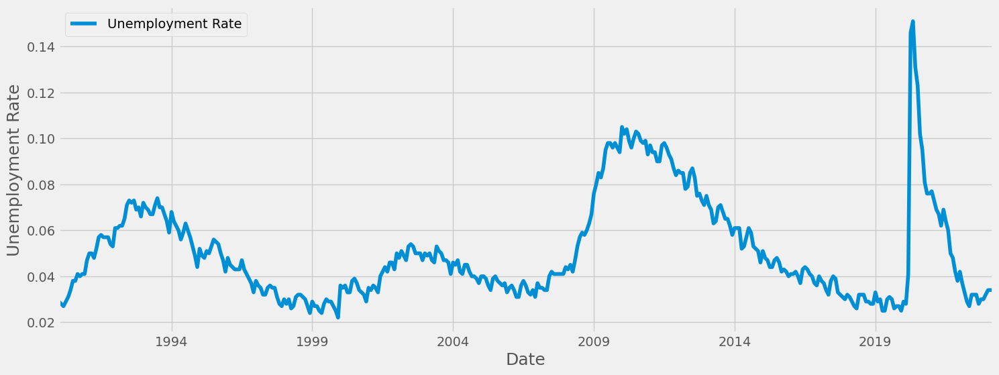

In [ ]:
plot_county(Orange)

In [ ]:
U_R(Orange)

Highest unemployment rate: 0.151
Date of highest unemployment: 2020-05


In [ ]:
Orange = Orange.iloc[0:-38]
U_R(Orange)

Highest unemployment rate: 0.105
Date of highest unemployment: 2010-01


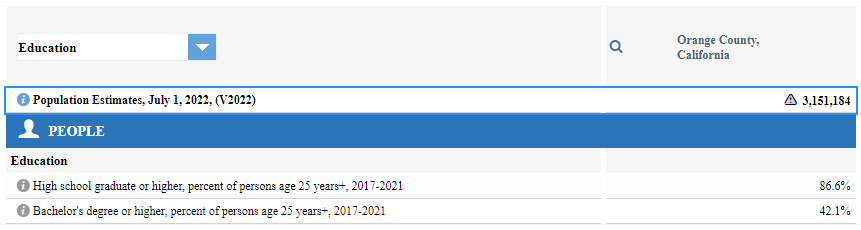 <br>

Orange County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 10.5%

In [ ]:
ed('Orange', 86.6, 42.1, 10.5, 1, 34)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
29,Tehama,85.8,17.0,17.9,0,29
30,Marin,93.4,60.1,8.7,1,47
31,Trinity,93.9,18.6,25.4,0,55
32,Monterey,73.0,26.5,20.1,0,2
33,Orange,86.6,42.1,10.5,1,34


### __[San Francisco County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06075.pdf)__

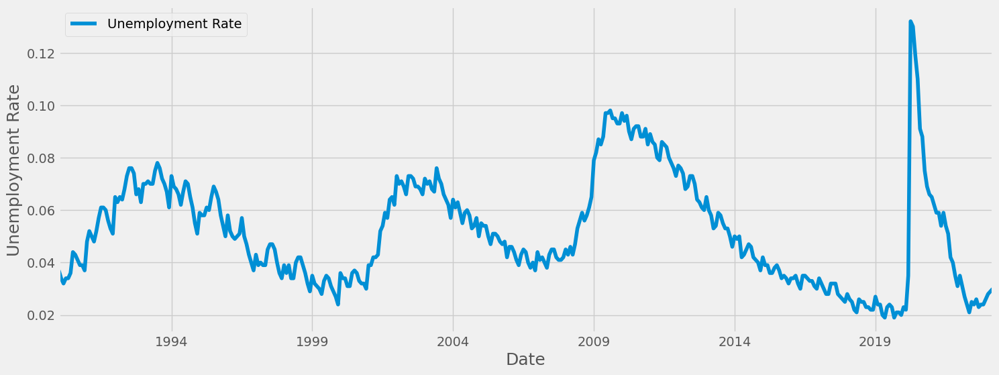

In [ ]:
plot_county(San_Francisco)

In [ ]:
U_R(San_Francisco)

Highest unemployment rate: 0.132
Date of highest unemployment: 2020-04


In [ ]:
San_Francisco = San_Francisco.iloc[0:-38]
U_R(San_Francisco)

Highest unemployment rate: 0.098
Date of highest unemployment: 2009-08


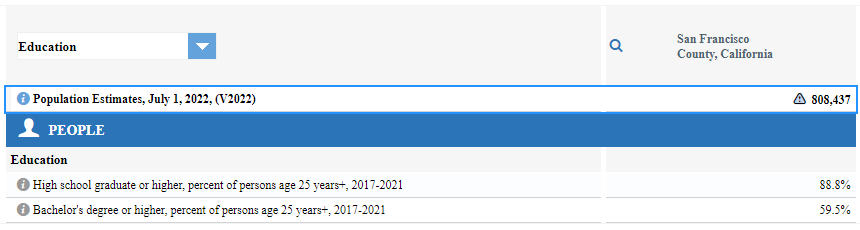 <br>

San Francisco County experienced their highest rate of unemployement in the pandemic and their second highest in 2009 at 9.8%

In [ ]:
ed('San Francisco', 88.8, 59.5, 9.8, 1, 57)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
30,Marin,93.4,60.1,8.7,1,47
31,Trinity,93.9,18.6,25.4,0,55
32,Monterey,73.0,26.5,20.1,0,2
33,Orange,86.6,42.1,10.5,1,34
34,San Francisco,88.8,59.5,9.8,1,57


### __[Mendocino County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06045.pdf)__

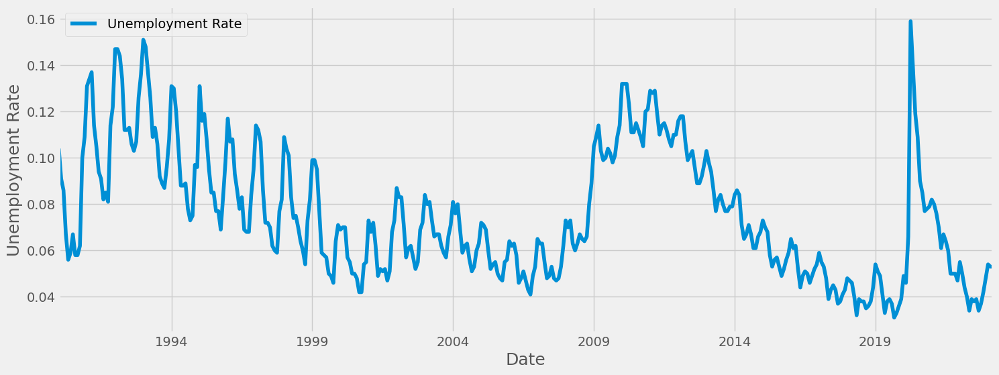

In [ ]:
plot_county(Mendocino)

In [ ]:
U_R(Mendocino)

Highest unemployment rate: 0.159
Date of highest unemployment: 2020-04


In [ ]:
Mendocino = Mendocino.iloc[0:-38]
U_R(Mendocino)

Highest unemployment rate: 0.151
Date of highest unemployment: 1993-01


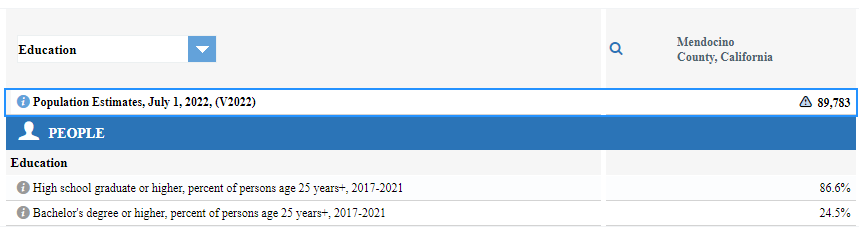<br>

Mendocino County experienced their highest rate of unemployement in the pandemic and their second highest in 1993 at 15.1%

In [ ]:
ed('Mendocino', 86.6, 24.5, 15.1, 1, 30)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
31,Trinity,93.9,18.6,25.4,0,55
32,Monterey,73.0,26.5,20.1,0,2
33,Orange,86.6,42.1,10.5,1,34
34,San Francisco,88.8,59.5,9.8,1,57
35,Mendocino,86.6,24.5,15.1,1,30


### __[Santa Cruz County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06087.pdf)__

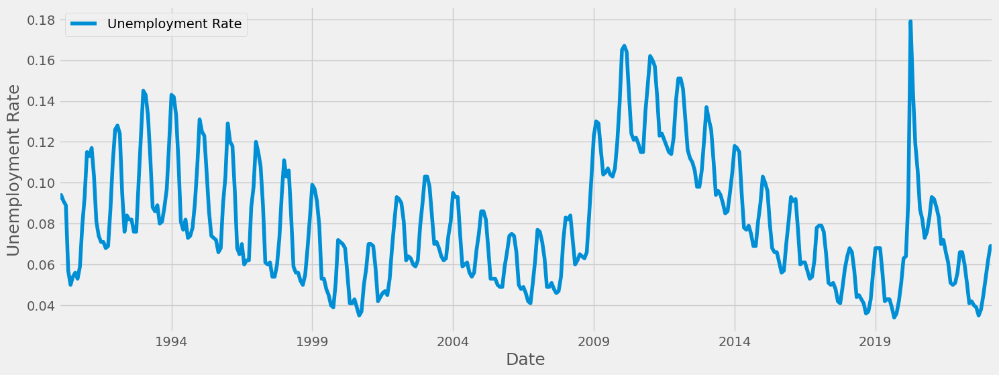

In [ ]:
plot_county(Santa_Cruz)

In [ ]:
U_R(Santa_Cruz)

Highest unemployment rate: 0.179
Date of highest unemployment: 2020-04


In [ ]:
Santa_Cruz = Santa_Cruz.iloc[0:-38]
U_R(Santa_Cruz)

Highest unemployment rate: 0.167
Date of highest unemployment: 2010-02


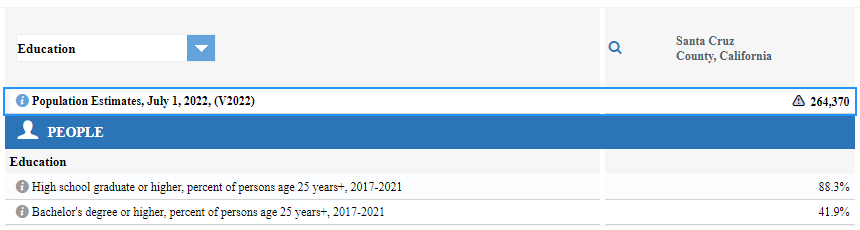<br>

Santa Cruz County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 16.7%

In [ ]:
ed('Santa Cruz', 88.3, 41.9, 16.7, 1, 17)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
32,Monterey,73.0,26.5,20.1,0,2
33,Orange,86.6,42.1,10.5,1,34
34,San Francisco,88.8,59.5,9.8,1,57
35,Mendocino,86.6,24.5,15.1,1,30
36,Santa Cruz,88.3,41.9,16.7,1,17


### __[Kings County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06031.pdf)__

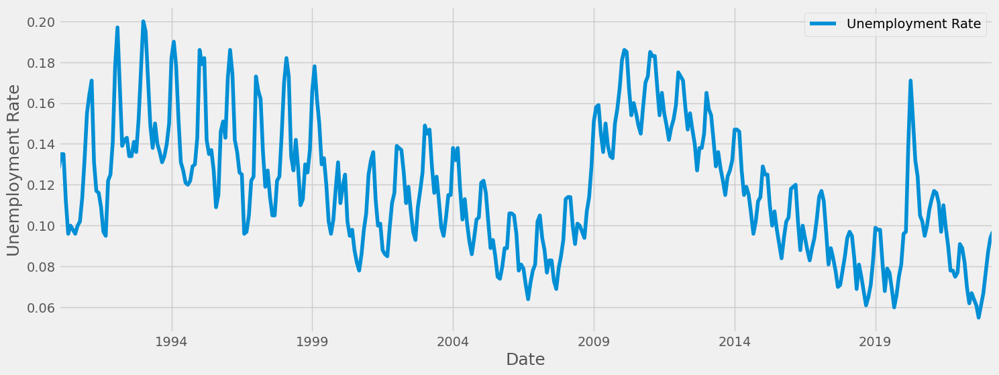

In [ ]:
plot_county(Kings)

In [ ]:
U_R(Kings)

Highest unemployment rate: 0.2
Date of highest unemployment: 1993-01


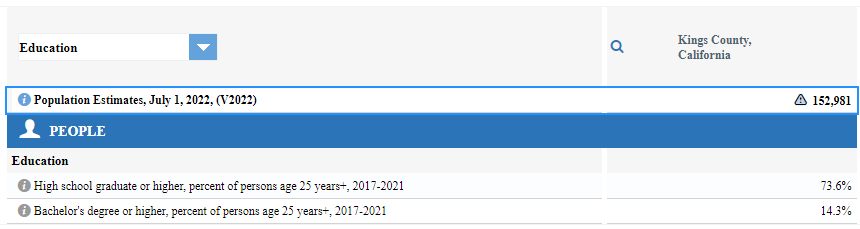 <br>

Kings County experienced their highest rate of unemployement in 1993 at 20.0%

In [ ]:
ed('Kings', 73.6, 14.3, 20.0, 0, 12)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
33,Orange,86.6,42.1,10.5,1,34
34,San Francisco,88.8,59.5,9.8,1,57
35,Mendocino,86.6,24.5,15.1,1,30
36,Santa Cruz,88.3,41.9,16.7,1,17
37,Kings,73.6,14.3,20.0,0,12


### __[Fresno County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06019.pdf)__

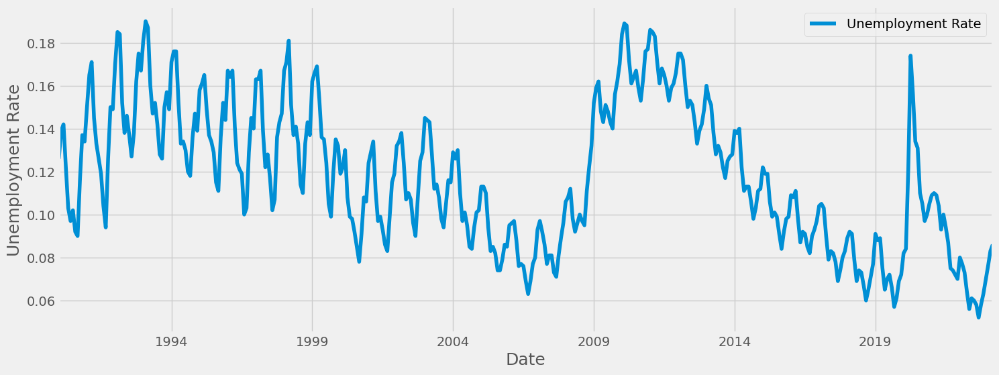

In [ ]:
plot_county(Fresno)

In [ ]:
U_R(Fresno)

Highest unemployment rate: 0.19
Date of highest unemployment: 1993-02


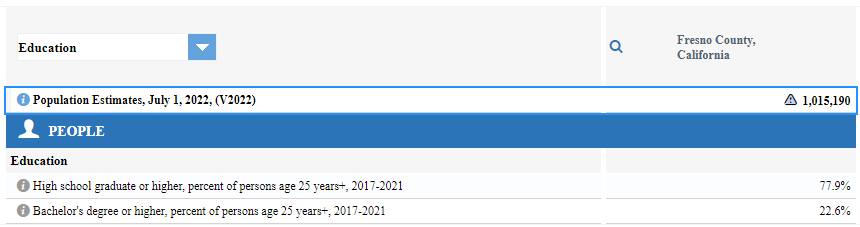 <br>

Fresno County experienced their highest rate of unemployement in 1993 at 19.0%

In [ ]:
ed('Fresno', 77.9, 22.6, 19.0, 0, 1)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
34,San Francisco,88.8,59.5,9.8,1,57
35,Mendocino,86.6,24.5,15.1,1,30
36,Santa Cruz,88.3,41.9,16.7,1,17
37,Kings,73.6,14.3,20.0,0,12
38,Fresno,77.9,22.6,19.0,0,1


### __[Santa Barbara County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06083.pdf)__

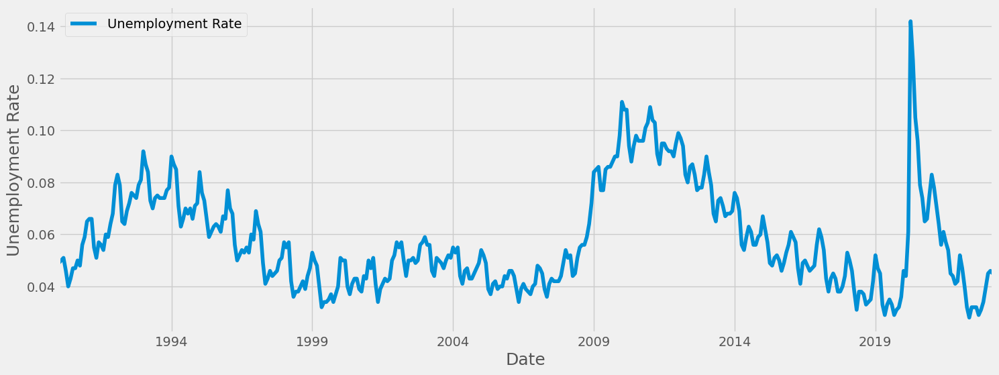

In [ ]:
plot_county(Santa_Barbara)

In [ ]:
U_R(Santa_Barbara)

Highest unemployment rate: 0.142
Date of highest unemployment: 2020-04


In [ ]:
Santa_Barbara = Santa_Barbara.iloc[0:-38]
U_R(Santa_Barbara)

Highest unemployment rate: 0.111
Date of highest unemployment: 2010-01


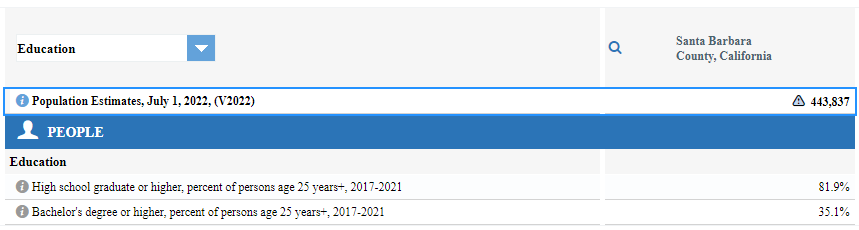 <br>

Santa Barbara County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 11.1%

In [ ]:
ed('Santa Barbara', 81.9, 35.1, 11.1, 1, 7)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
35,Mendocino,86.6,24.5,15.1,1,30
36,Santa Cruz,88.3,41.9,16.7,1,17
37,Kings,73.6,14.3,20.0,0,12
38,Fresno,77.9,22.6,19.0,0,1
39,Santa Barbara,81.9,35.1,11.1,1,7


### __[Shasta County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06089.pdf)__

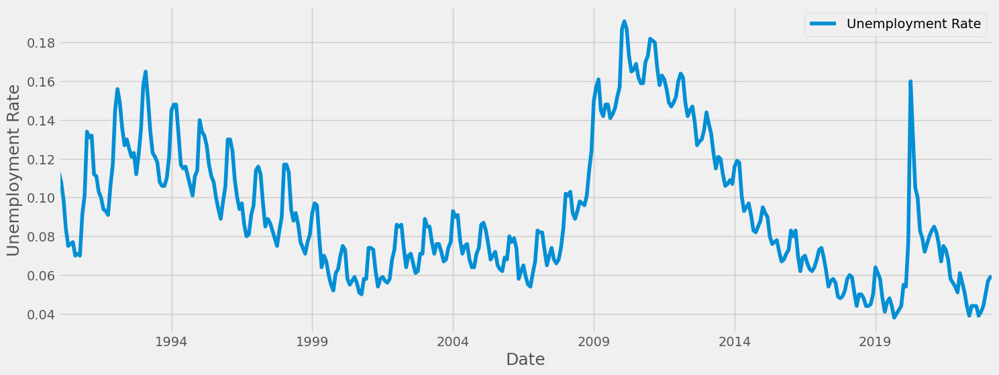

In [ ]:
plot_county(Shasta)

In [ ]:
U_R(Shasta)

Highest unemployment rate: 0.191
Date of highest unemployment: 2010-02


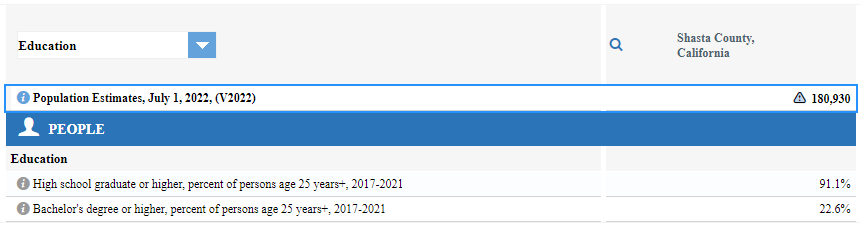 <br>

Shasta County experienced their highest rate of unemployement in 2010 at 19.1

In [ ]:
ed('Shasta', 91.1, 22.6, 19.1, 0, 43)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
36,Santa Cruz,88.3,41.9,16.7,1,17
37,Kings,73.6,14.3,20.0,0,12
38,Fresno,77.9,22.6,19.0,0,1
39,Santa Barbara,81.9,35.1,11.1,1,7
40,Shasta,91.1,22.6,19.1,0,43


### __[Sonoma County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06097.pdf)__

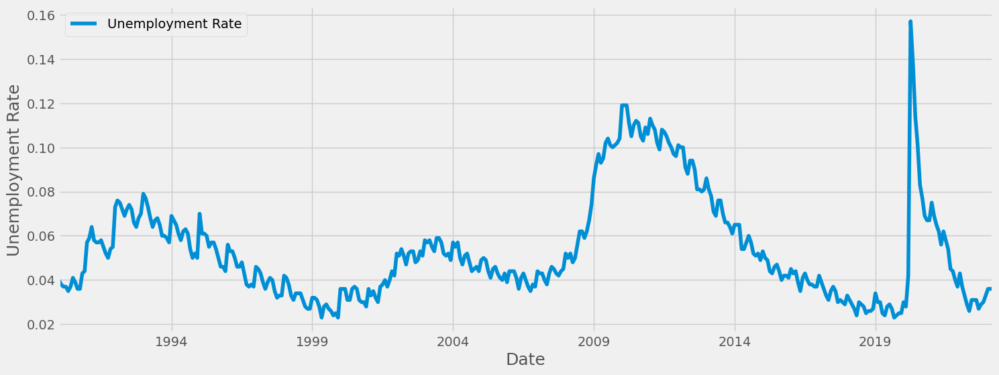

In [ ]:
plot_county(Sonoma)

In [ ]:
U_R(Sonoma)

Highest unemployment rate: 0.157
Date of highest unemployment: 2020-04


In [ ]:
Sonoma = Sonoma.iloc[0:-38]
U_R(Sonoma)

Highest unemployment rate: 0.119
Date of highest unemployment: 2010-02


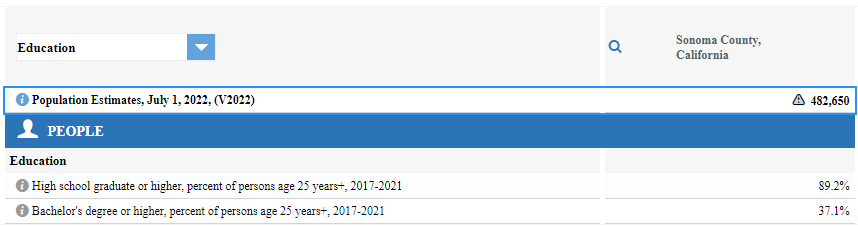 <br>

Sonoma County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 11.9%

In [ ]:
ed('Sonoma', 89.2, 37.1, 11.9, 1, 16)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
37,Kings,73.6,14.3,20.0,0,12
38,Fresno,77.9,22.6,19.0,0,1
39,Santa Barbara,81.9,35.1,11.1,1,7
40,Shasta,91.1,22.6,19.1,0,43
41,Sonoma,89.2,37.1,11.9,1,16


### __[Kern County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06029.pdf)__

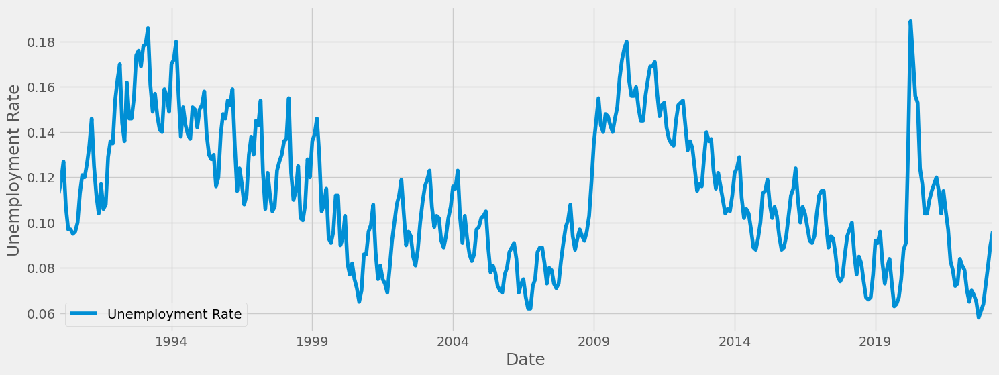

In [ ]:
plot_county(Kern)

In [ ]:
U_R(Kern)

Highest unemployment rate: 0.189
Date of highest unemployment: 2020-04


In [ ]:
Kern = Kern.iloc[0:-38]
U_R(Kern)

Highest unemployment rate: 0.186
Date of highest unemployment: 1993-03


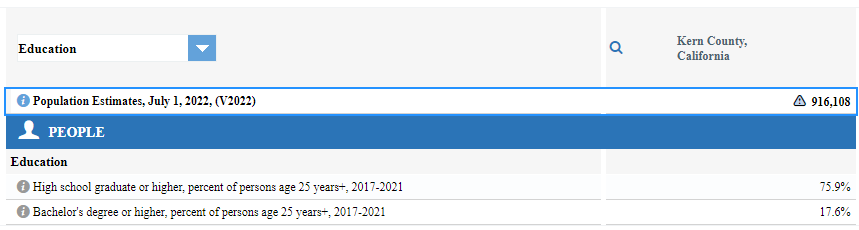 <br>

Kern County experienced their highest rate of unemployement in the pandemic and their second highest in 1993 at 18.6%

In [ ]:
ed('Kern', 75.9, 17.6, 18.6, 1, 3)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
38,Fresno,77.9,22.6,19.0,0,1
39,Santa Barbara,81.9,35.1,11.1,1,7
40,Shasta,91.1,22.6,19.1,0,43
41,Sonoma,89.2,37.1,11.9,1,16
42,Kern,75.9,17.6,18.6,1,3


### __[Modoc County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06049.pdf)__

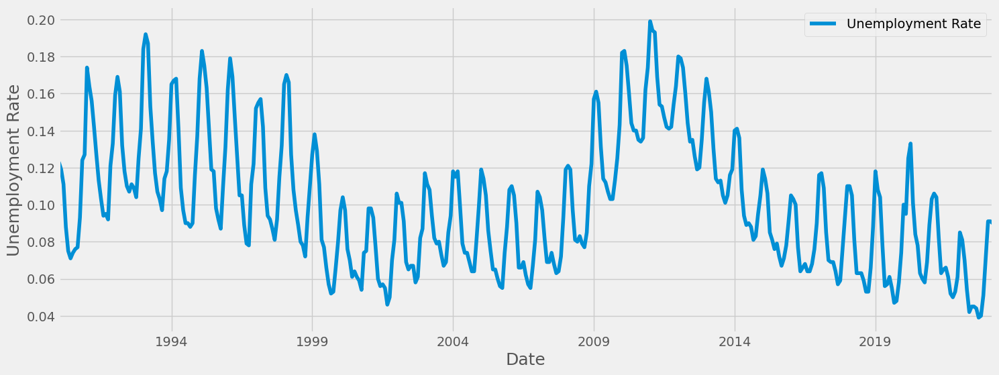

In [ ]:
plot_county(Modoc)

In [ ]:
U_R(Modoc)

Highest unemployment rate: 0.199
Date of highest unemployment: 2011-01


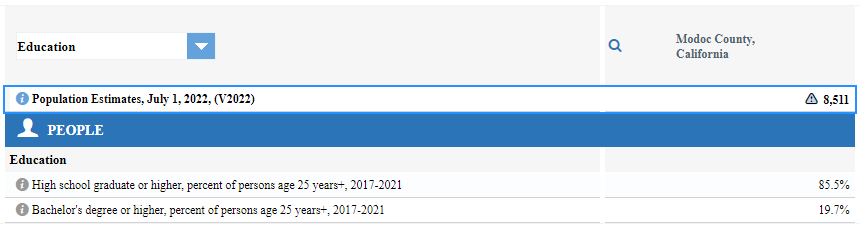 <br>

Modoc County experienced their highest rate of unemployement in the pandemic and their second highest in 2011 at 19.9%

In [ ]:
ed('Modoc', 85.5, 19.7, 19.9, 0, 35)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
39,Santa Barbara,81.9,35.1,11.1,1,7
40,Shasta,91.1,22.6,19.1,0,43
41,Sonoma,89.2,37.1,11.9,1,16
42,Kern,75.9,17.6,18.6,1,3
43,Modoc,85.5,19.7,19.9,0,35


### __[Sacramento County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06067.pdf)__

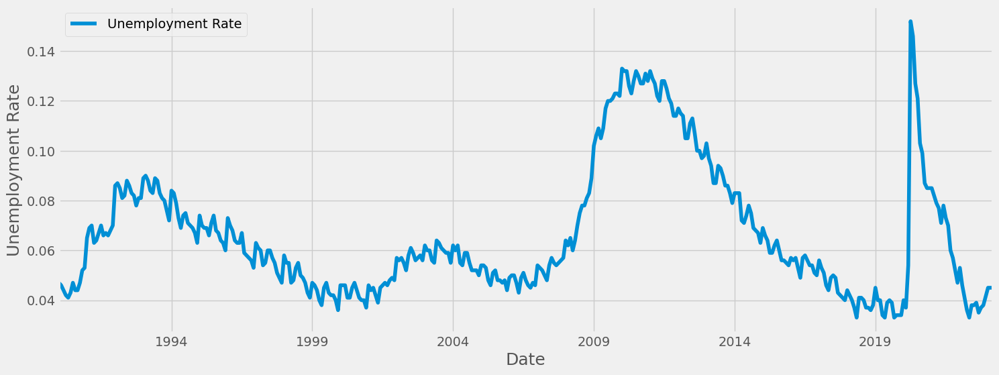

In [ ]:
plot_county(Sacramento)

In [ ]:
U_R(Sacramento)

Highest unemployment rate: 0.152
Date of highest unemployment: 2020-04


In [ ]:
Sacramento = Sacramento.iloc[0:-38]
U_R(Sacramento)

Highest unemployment rate: 0.133
Date of highest unemployment: 2010-01


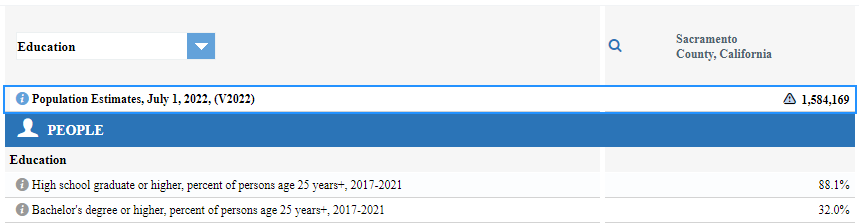 <br>

Sacramento County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 13.3%

In [ ]:
ed('Sacramento', 88.1, 32.0, 13.3, 1, 24)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
40,Shasta,91.1,22.6,19.1,0,43
41,Sonoma,89.2,37.1,11.9,1,16
42,Kern,75.9,17.6,18.6,1,3
43,Modoc,85.5,19.7,19.9,0,35
44,Sacramento,88.1,32.0,13.3,1,24


### __[Santa Clara County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06085.pdf)__

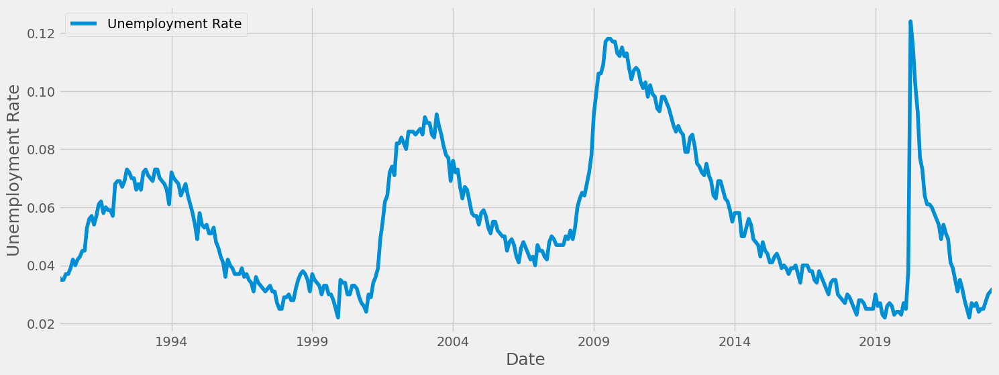

In [ ]:
plot_county(Santa_Clara)

In [ ]:
U_R(Santa_Clara)

Highest unemployment rate: 0.124
Date of highest unemployment: 2020-04


In [ ]:
Santa_Clara = Santa_Clara.iloc[0:-38]
U_R(Santa_Clara)

Highest unemployment rate: 0.118
Date of highest unemployment: 2009-08


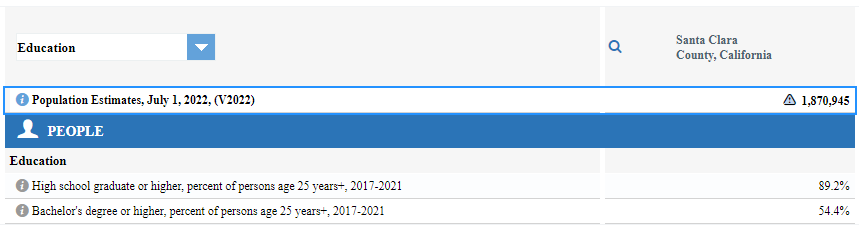<br>

Santa Clara County experienced their highest rate of unemployement in the pandemic and their second highest in 2009 at 11.8%

In [ ]:
ed('Santa Clara', 89.2, 54.4, 11.8, 1, 25)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
41,Sonoma,89.2,37.1,11.9,1,16
42,Kern,75.9,17.6,18.6,1,3
43,Modoc,85.5,19.7,19.9,0,35
44,Sacramento,88.1,32.0,13.3,1,24
45,Santa Clara,89.2,54.4,11.8,1,25


### __[San Joaquin County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06077.pdf)__

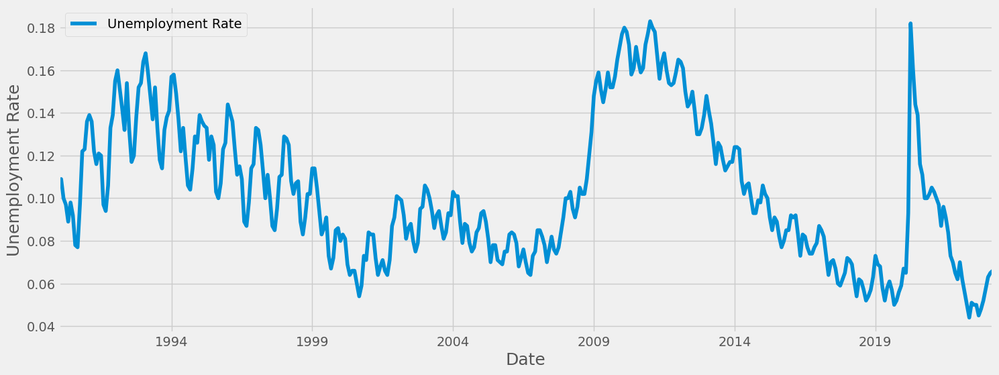

In [ ]:
plot_county(San_Joaquin)

In [ ]:
U_R(San_Joaquin)

Highest unemployment rate: 0.183
Date of highest unemployment: 2011-01


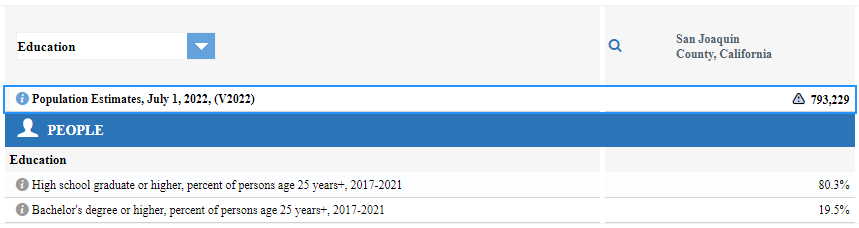 <br>

San Joaquin County experienced their highest rate of unemployement in 2011 at 18.3%

In [ ]:
ed('San Joaquin', 80.3, 19.5, 18.3, 0, 5)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
42,Kern,75.9,17.6,18.6,1,3
43,Modoc,85.5,19.7,19.9,0,35
44,Sacramento,88.1,32.0,13.3,1,24
45,Santa Clara,89.2,54.4,11.8,1,25
46,San Joaquin,80.3,19.5,18.3,0,5


### __[Nevada County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06057.pdf)__

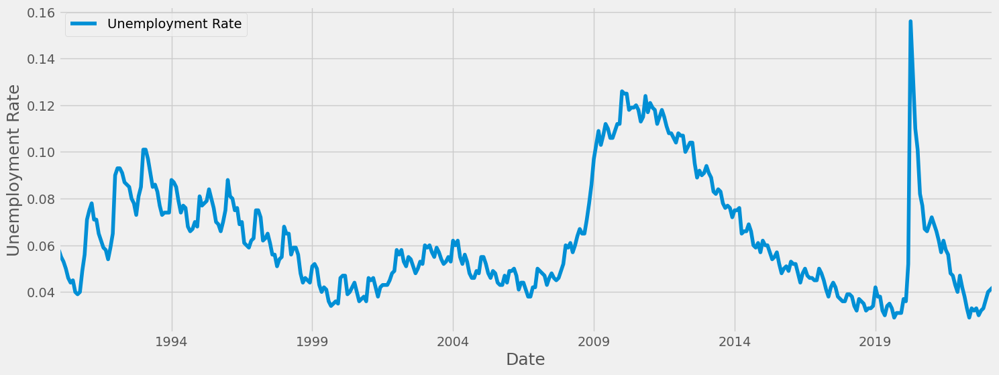

In [ ]:
plot_county(Nevada)

In [ ]:
U_R(Nevada)

Highest unemployment rate: 0.156
Date of highest unemployment: 2020-04


In [ ]:
Nevada = Nevada.iloc[0:-38]
U_R(Nevada)

Highest unemployment rate: 0.126
Date of highest unemployment: 2010-01


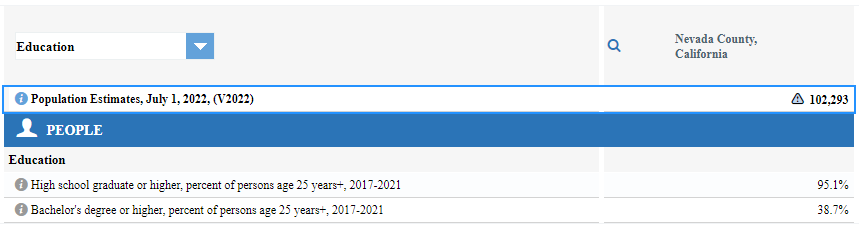<br>

Nevada County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 12.6%

In [ ]:
ed('Nevada', 95.1, 38.7, 12.6, 1, 49)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
43,Modoc,85.5,19.7,19.9,0,35
44,Sacramento,88.1,32.0,13.3,1,24
45,Santa Clara,89.2,54.4,11.8,1,25
46,San Joaquin,80.3,19.5,18.3,0,5
47,Nevada,95.1,38.7,12.6,1,49


### __[Mariposa County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06043.pdf)__

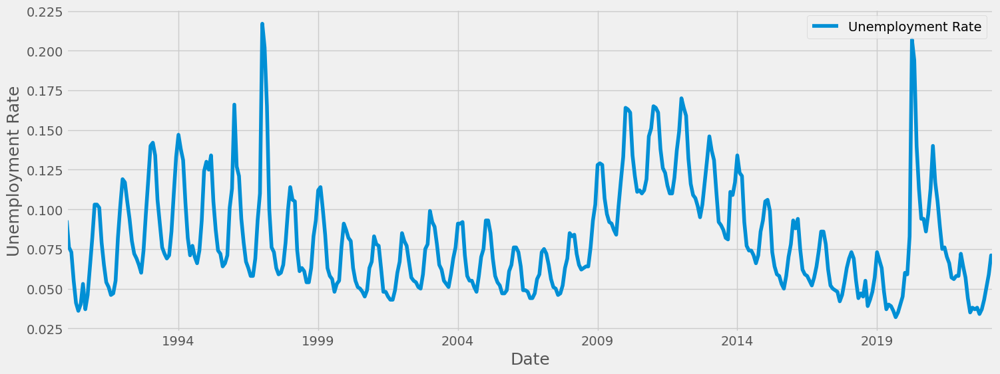

In [ ]:
plot_county(Mariposa)

In [ ]:
U_R(Mariposa)

Highest unemployment rate: 0.217
Date of highest unemployment: 1997-01


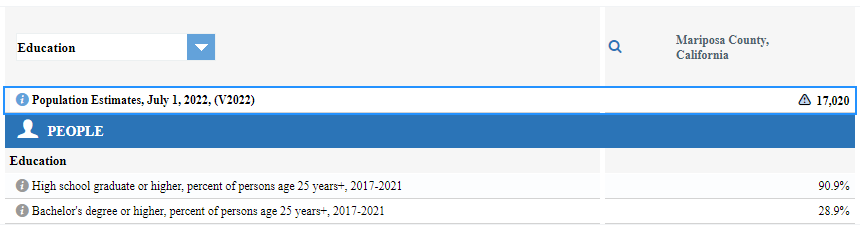 <br>

Mariposa County experienced their highest rate of unemployement 1997 at 21.7%

In [ ]:
ed('Mariposa', 90.9, 28.9, 21.7, 0, 52)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
44,Sacramento,88.1,32.0,13.3,1,24
45,Santa Clara,89.2,54.4,11.8,1,25
46,San Joaquin,80.3,19.5,18.3,0,5
47,Nevada,95.1,38.7,12.6,1,49
48,Mariposa,90.9,28.9,21.7,0,52


### __[Tulare County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06107.pdf)__

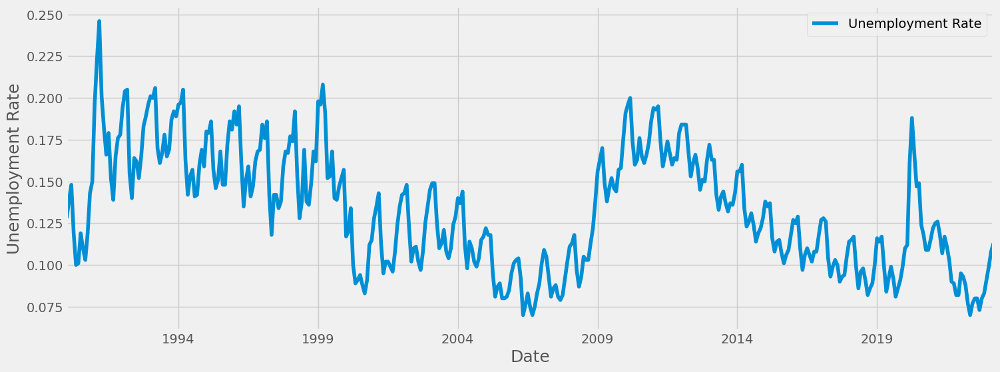

In [ ]:
plot_county(Tulare)

In [ ]:
U_R(Tulare)

Highest unemployment rate: 0.246
Date of highest unemployment: 1991-03


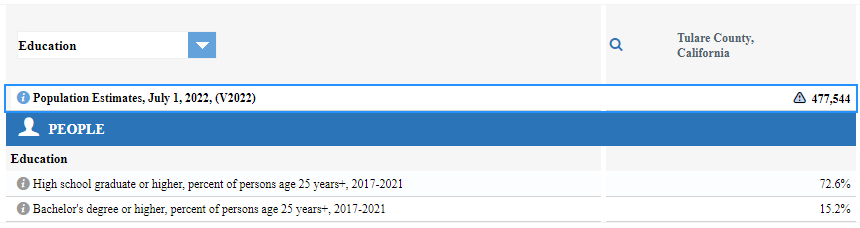 <br>

Tulare County experienced their highest rate of unemployement in 1991 at 24.6%

In [ ]:
ed('Tulare', 72.6, 15.2, 24.6, 0, 4)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
45,Santa Clara,89.2,54.4,11.8,1,25
46,San Joaquin,80.3,19.5,18.3,0,5
47,Nevada,95.1,38.7,12.6,1,49
48,Mariposa,90.9,28.9,21.7,0,52
49,Tulare,72.6,15.2,24.6,0,4


### __[Contra Costa County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06013.pdf)__

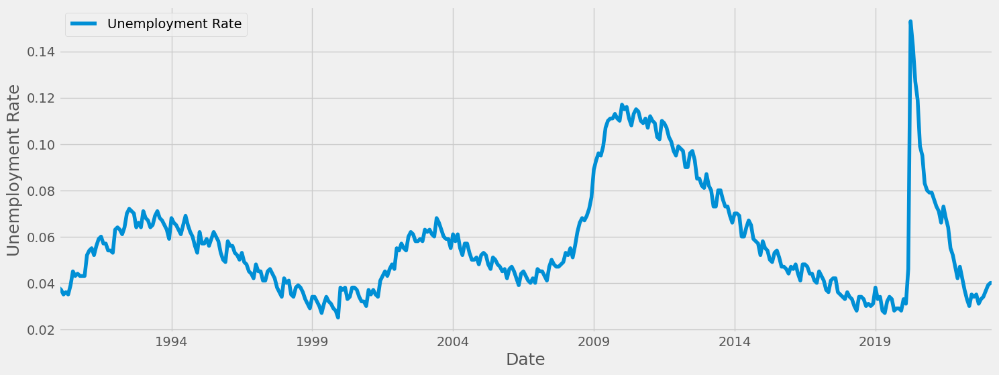

In [ ]:
plot_county(Contra_Costa)

In [ ]:
U_R(Contra_Costa)

Highest unemployment rate: 0.153
Date of highest unemployment: 2020-04


In [ ]:
Contra_Costa = Contra_Costa.iloc[0:-38]
U_R(Contra_Costa)

Highest unemployment rate: 0.117
Date of highest unemployment: 2010-01


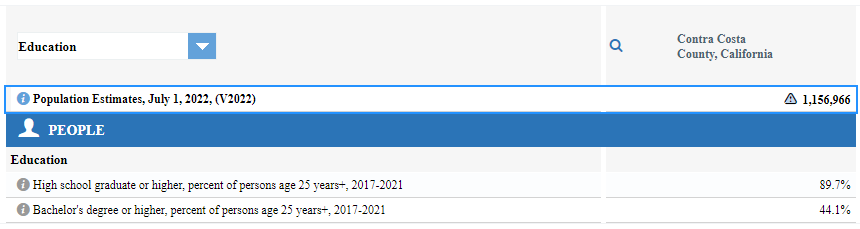 <br>

Contra Costa County experienced their highest rate of unemployement in the pandemic and their second highest in 2010 at 11.7%

In [ ]:
ed('Contra Costa', 89.7, 44.1, 11.7, 1, 39)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
46,San Joaquin,80.3,19.5,18.3,0,5
47,Nevada,95.1,38.7,12.6,1,49
48,Mariposa,90.9,28.9,21.7,0,52
49,Tulare,72.6,15.2,24.6,0,4
50,Contra Costa,89.7,44.1,11.7,1,39


### __[Merced County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06047.pdf)__

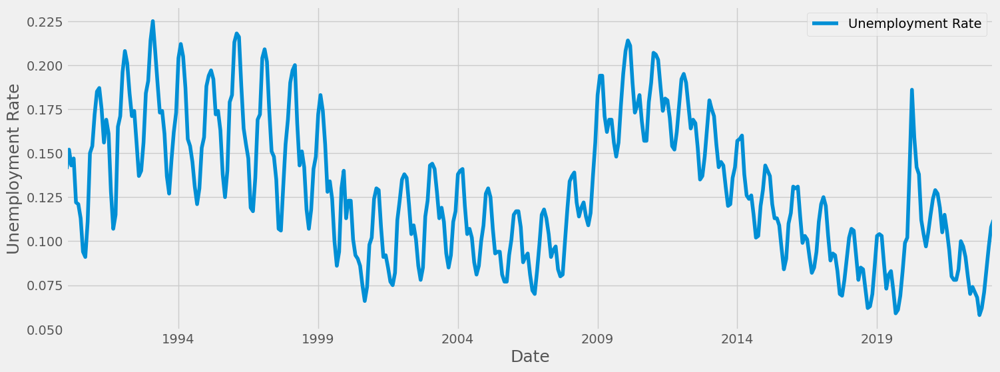

In [ ]:
plot_county(Merced)

In [ ]:
U_R(Merced)

Highest unemployment rate: 0.225
Date of highest unemployment: 1993-02


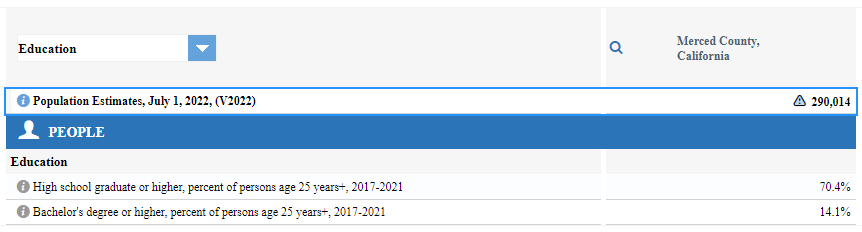<br>

Merced County experienced their highest rate of unemployement in the 1993 at 22.5%

In [ ]:
ed('Merced', 70.4, 14.1, 22.5, 0, 9)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
47,Nevada,95.1,38.7,12.6,1,49
48,Mariposa,90.9,28.9,21.7,0,52
49,Tulare,72.6,15.2,24.6,0,4
50,Contra Costa,89.7,44.1,11.7,1,39
51,Merced,70.4,14.1,22.5,0,9


### __[San Benito County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06069.pdf)__

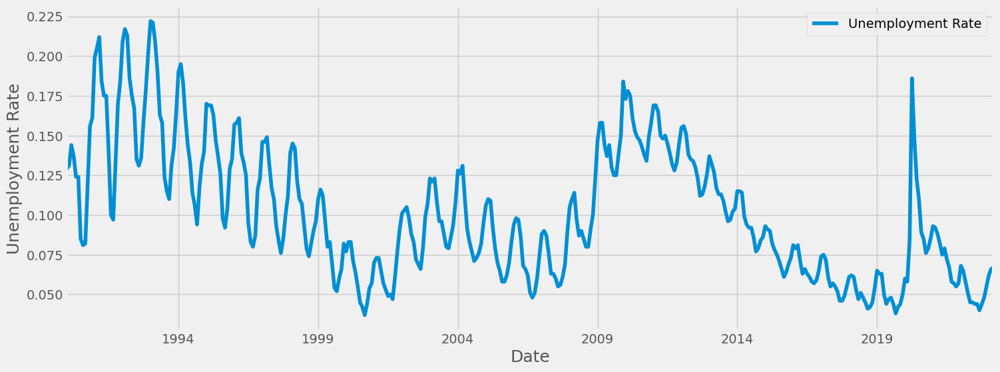

In [ ]:
plot_county(San_Benito)

In [ ]:
U_R(San_Benito)

Highest unemployment rate: 0.222
Date of highest unemployment: 1993-01


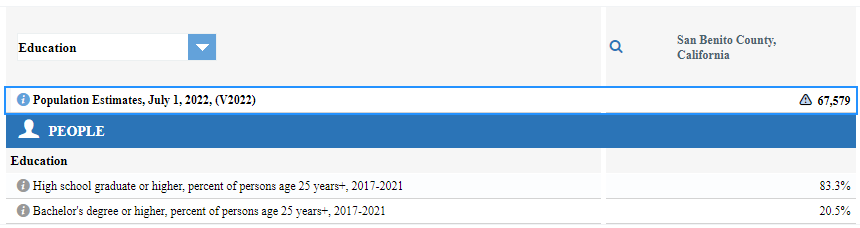 <br>

San Benito County experienced their highest rate of unemployement in 1993 at 22.2%

In [ ]:
ed('San Benito', 83.3, 20.5, 22.2, 0, 32)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
48,Mariposa,90.9,28.9,21.7,0,52
49,Tulare,72.6,15.2,24.6,0,4
50,Contra Costa,89.7,44.1,11.7,1,39
51,Merced,70.4,14.1,22.5,0,9
52,San Benito,83.3,20.5,22.2,0,32


### __[Lassen County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06035.pdf)__

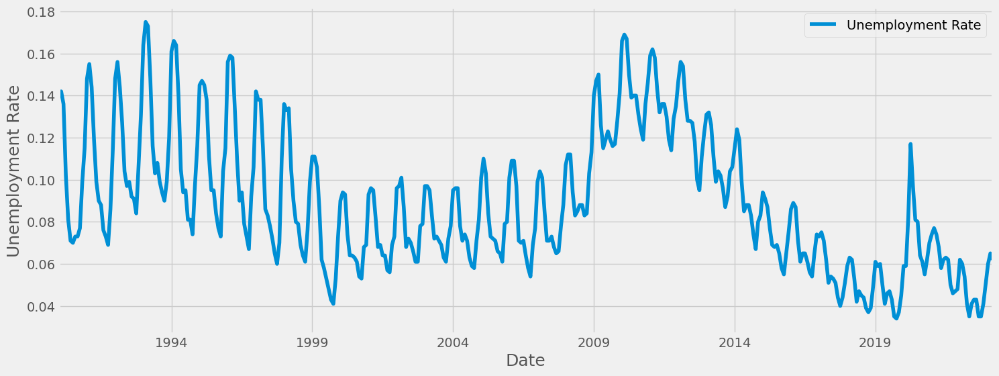

In [ ]:
plot_county(Lassen)

In [ ]:
U_R(Lassen)

Highest unemployment rate: 0.175
Date of highest unemployment: 1993-02


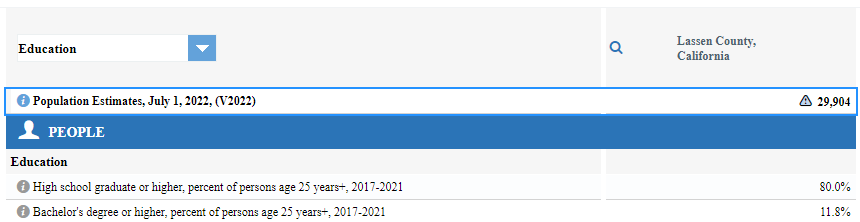<br>

Lassen County experienced their highest rate of unemployement in 1993 at 17.5%

In [ ]:
ed('Lassen', 80.0, 11.8, 17.5, 0, 45)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
49,Tulare,72.6,15.2,24.6,0,4
50,Contra Costa,89.7,44.1,11.7,1,39
51,Merced,70.4,14.1,22.5,0,9
52,San Benito,83.3,20.5,22.2,0,32
53,Lassen,80.0,11.8,17.5,0,45


### __[San Mateo County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06081.pdf)__

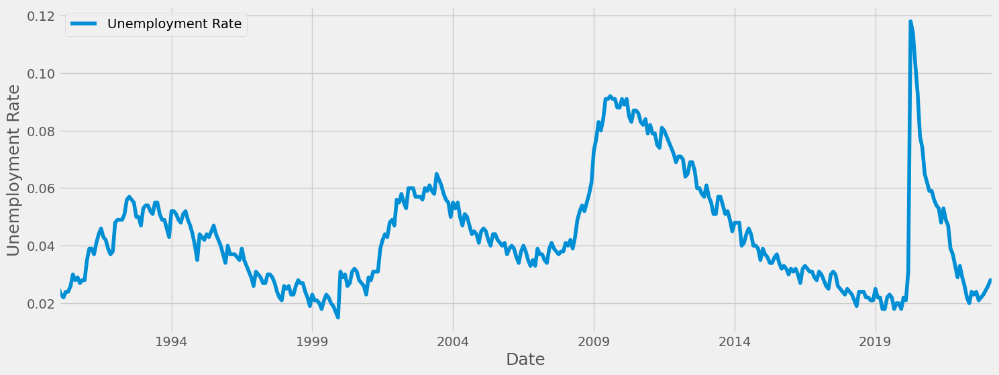

In [ ]:
plot_county(San_Mateo)

In [ ]:
U_R(San_Mateo)

Highest unemployment rate: 0.118
Date of highest unemployment: 2020-04


In [ ]:
San_Mateo = San_Mateo.iloc[0:-38]
U_R(San_Mateo)

Highest unemployment rate: 0.092
Date of highest unemployment: 2009-08


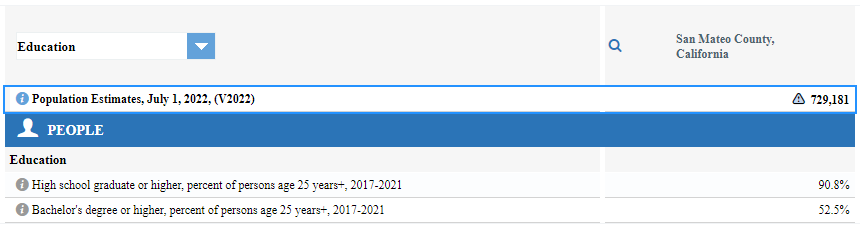<br>

San Mateo County experienced their highest rate of unemployement in the pandemic and their second highest in 2009 at 9.2%

In [ ]:
ed('San Mateo', 90.8, 52.5, 9.2, 1, 37)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
50,Contra Costa,89.7,44.1,11.7,1,39
51,Merced,70.4,14.1,22.5,0,9
52,San Benito,83.3,20.5,22.2,0,32
53,Lassen,80.0,11.8,17.5,0,45
54,San Mateo,90.8,52.5,9.2,1,37


### __[Stanislaus County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06099.pdf)__

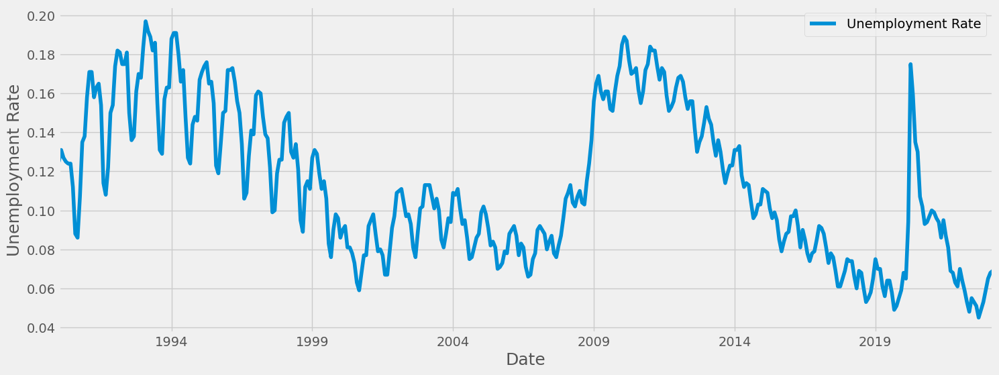

In [ ]:
plot_county(Stanislaus)

In [ ]:
U_R(Stanislaus)

Highest unemployment rate: 0.197
Date of highest unemployment: 1993-02


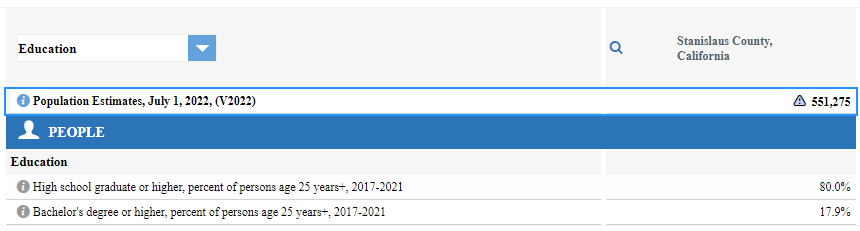<br>

Stanislaus County experienced their highest rate of unemployement in 1993 at 19.7%

In [ ]:
ed('Stanislaus', 80.0, 17.9, 19.7, 0, 8)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
51,Merced,70.4,14.1,22.5,0,9
52,San Benito,83.3,20.5,22.2,0,32
53,Lassen,80.0,11.8,17.5,0,45
54,San Mateo,90.8,52.5,9.2,1,37
55,Stanislaus,80.0,17.9,19.7,0,8


### __[Inyo County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06027.pdf)__

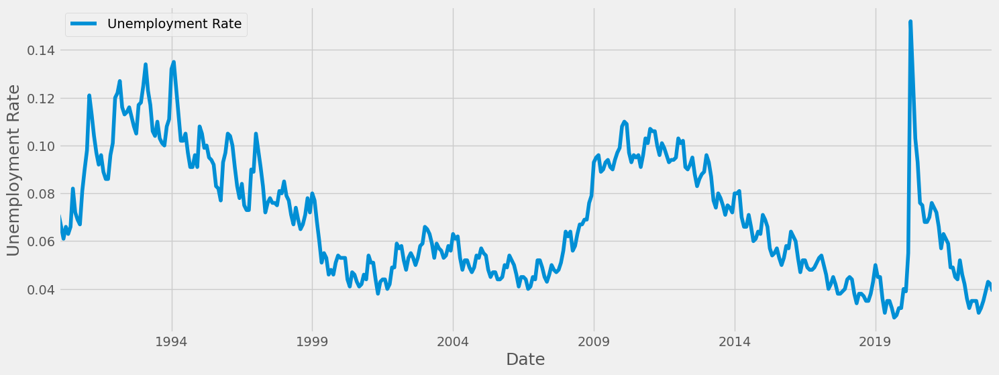

In [ ]:
plot_county(Inyo)

In [ ]:
U_R(Inyo)

Highest unemployment rate: 0.152
Date of highest unemployment: 2020-04


In [ ]:
Inyo = Inyo.iloc[0:-38]
U_R(Inyo)

Highest unemployment rate: 0.135
Date of highest unemployment: 1994-02


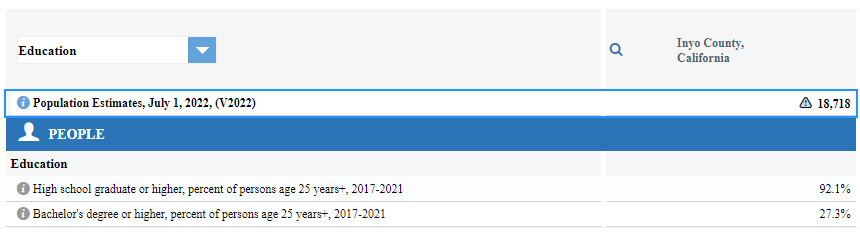 <br>

Inyo County experienced their highest rate of unemployement in the pandemic and their second highest in 1994 at 13.5%

In [ ]:
ed('Inyo', 92.5, 27.3, 13.5, 1, 53)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
52,San Benito,83.3,20.5,22.2,0,32
53,Lassen,80.0,11.8,17.5,0,45
54,San Mateo,90.8,52.5,9.2,1,37
55,Stanislaus,80.0,17.9,19.7,0,8
56,Inyo,92.5,27.3,13.5,1,53


### __[Imperial County](https://www.nass.usda.gov/Publications/AgCensus/2017/Online_Resources/County_Profiles/California/cp06025.pdf)__

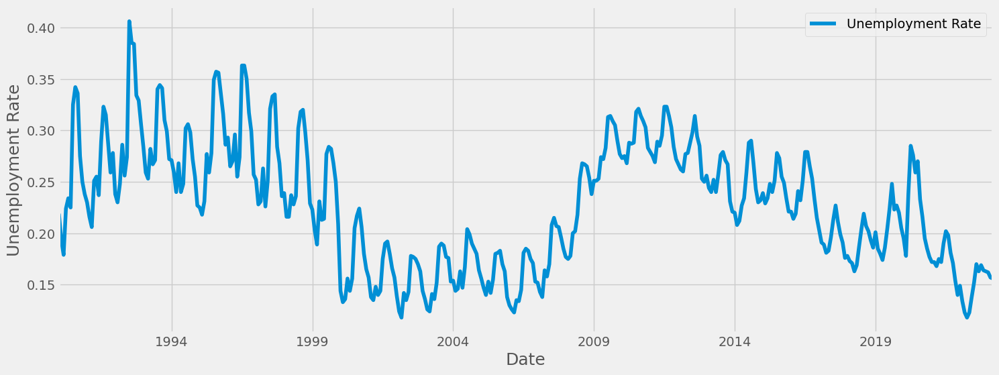

In [ ]:
plot_county(Imperial)

In [ ]:
U_R(Imperial)

Highest unemployment rate: 0.406
Date of highest unemployment: 1992-07


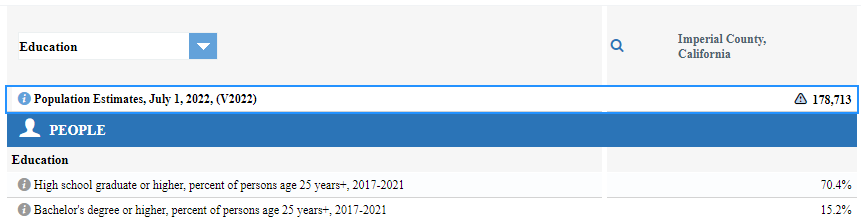 <br>

Imperial County experienced their highest rate of unemployement in 1992 at 40.6%

In [ ]:
ed('Imperial', 70.4, 15.2, 40.6, 0, 8)
county_ed.tail()

,County,High School Grad,4 Year College Degree,Highest Unemployment Rate,Highest UR was during Pandemic,2017 Census of Agriculture Rank(Crops)
53,Lassen,80.0,11.8,17.5,0,45
54,San Mateo,90.8,52.5,9.2,1,37
55,Stanislaus,80.0,17.9,19.7,0,8
56,Inyo,92.5,27.3,13.5,1,53
57,Imperial,70.4,15.2,40.6,0,8


In [ ]:
c_e = county_ed.copy()

c_e.to_csv('county_ed.csv', index=False)

### **Hypothesis Testing**

Our original hypothesis:

_According to the article  by Elen Theodossiou and Steven F. Hipple, __['Unemployment remains high in 2010'](https://www.bls.gov/opub/mlr/2011/03/art1full.pdf)__, __"Workers with less education continued to experience a
substantially higher unemployment rate than did better educated members of the labor force."__(4) <br>

The pandemic in 2020 created massive gaps in employment opportunity internationally but historically California has ranked highly in unemployment, at the time of this project (March 2023 was the most recent data) California's unemployment rate is 45th of 51 entries. <br>

__Our goal then is to put Theodossiou and Hipple's claim to the test.__ We will see if California cities experienced a historic rate of unemployment higher than 2020's pandemic and if so, explore higher education data from the __[United States Census Bureau](https://www.census.gov/)__. <br> _

#### So how will we test this?

We have created a dataset to test whether or not there is a connection between education level and higher rates of unemployment; we have a binary classifier as one of our targets and can create a small classification model to test if there is a correlation between education level and unemployment rate.

We can also compare a regression model on level of education and rate of unemployment to see if there is any correlation between the two.

## Baseline Model: DecisionTreeClassifier()

We will test to find which feature is most highly correlated to unemployment rate.

In [ ]:
# make variable name smaller for ease of use
ce = county_ed.copy()


# drop 'city' from our new variable
ce = ce.drop(['County','Highest Unemployment Rate', '2017 Census of Agriculture Rank(Crops)'], axis =1)


# set target variable
target = ce['Highest UR was during Pandemic']

# drop target column
X = ce.drop(columns = 'Highest UR was during Pandemic', axis =1)

In [ ]:
# import train_test_split
from sklearn.model_selection import train_test_split

# create variables for modeling
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    target,
                                                    random_state = 42)

In [ ]:
# import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(random_state = 42)

# fit classifier onto training data
dtc.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [ ]:
# Baseline training score
print('Decision Tree Base Model training score: {}'.format(dtc.score(X_train, y_train)))
# Expected output: 0.9767441860465116

Decision Tree Base Model training score: 0.9767441860465116


In [ ]:
# Baseline testing score
print('Decision Tree Base Model testing score: {}'.format(dtc.score(X_test, y_test)))
# Expected output: 0.6666666666666666

Decision Tree Base Model testing score: 0.6666666666666666


Let's attempt a RandomForestClassifier to see if we can raise our testing score on our manufactured dataset.

## **RandomForestClassifier()**

In [ ]:
# import our classifier
from sklearn.ensemble import RandomForestClassifier

# set forest as variable, random_state = 42, max_depth = 3
forest = RandomForestClassifier(random_state = 42)

# fit new classifier onto training data
forest.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
print('Random Forest training score: {}'.format(forest.score(X_train, y_train)))
# Expected output: 0.9767441860465116

Random Forest training score: 0.9767441860465116


In [ ]:
print('Random Forest testing score: {}'.format(forest.score(X_test, y_test)))
# Expected output: 0.8666666666666667

Random Forest testing score: 0.8666666666666667


Great! Our testing score is up nearly 20%
Let's try some hyperparameter tuning to see if there is any effect. <br>

### Hyperparameter tuning on RandomForestClassifier() w/ Random Search Training

In [ ]:
# pull parameter keys from our classifier
RandomForestClassifier().get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [ ]:
# Create parameter grid for our RandomSearch
param_grid = {'bootstrap': [True, False],
              'max_depth': [1,2,3,4,5],
              'max_features': ['auto', 'sqrt'],
              'n_estimators': [1,2,3],
              'random_state': [42]}

In [ ]:
# import RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

rf = RandomForestClassifier()
rf_cv = RandomizedSearchCV(estimator = rf,
                           param_distributions = param_grid,
                           n_iter = 10,
                           cv=3
                          )
rf_cv.fit(X_train, y_train)
print('RandomizedSearchCV training score: {}'.format(rf_cv.score(X_train, y_train)))
# Expected output: 0.8837209302325582
print('RandomizedSearchCV testing score: {}'.format(rf_cv.score(X_test, y_test)))
# Expected output: 0.8

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

RandomizedSearchCV training score: 0.8837209302325582
RandomizedSearchCV testing score: 0.8


Our testing score is identical to the RandomForestClassifier used above and our training score was also better. Let's use the RandomForestClassifier to get feature importances. <br>

### Feature Importance

Feature importance is an analysis of the features in a dataset that correlate to our binary target column. How well do any of our features predict whether or not a city experienced their highest rate of unemployment during the pandemic?

In [ ]:
# Pull feature importance correlation to target
forest.feature_importances_

array([0.45824088, 0.54175912])

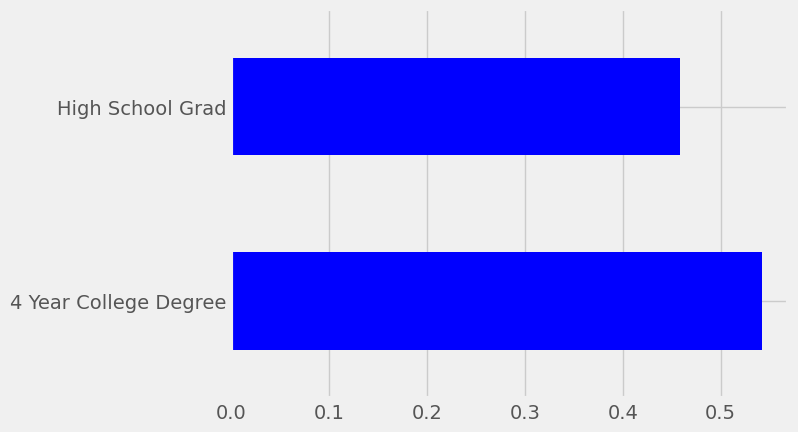

In [ ]:
# Throw column names on to feature_importances_ and plot them to get a visual of importance.
feat_importances = pd.Series(forest.feature_importances_, index = X.columns)
feat_importances.nlargest().plot(kind='barh', color = 'blue');

In [ ]:
# Education level of California cities that experienced highest rate of unemployment inside of pandemic
df_1 = c_e.loc[c_e['Highest UR was during Pandemic'] == 1]
print('Average percentage of population with high school diploma: {}'.format(df_1['High School Grad'].mean()))
print('Average percentage of population with college degree: {}'.format(df_1['4 Year College Degree'].mean()))
print('Average peak unemployment rate: {}'.format(df_1['Highest Unemployment Rate'].mean()))

Average percentage of population with high school diploma: 88.04482758620689
Average percentage of population with college degree: 36.12758620689655
Average peak unemployment rate: 13.048275862068966


In [ ]:
# Education level of California cities that experienced highest rate of unemployment outside of pandemic
df_0 = c_e.loc[c_e['Highest UR was during Pandemic'] ==0]
print('Average percentage of population with high school diploma: {}'.format(df_0['High School Grad'].mean()))
print('Average percentage of population with college degree: {}'.format(df_0['4 Year College Degree'].mean()))
print('Average peak unemployment rate: {}'.format(df_0['Highest Unemployment Rate'].mean()))

Average percentage of population with high school diploma: 82.42758620689655
Average percentage of population with college degree: 20.437931034482755
Average peak unemployment rate: 21.7448275862069


### Confusion Matrix

In [ ]:
# import confusion matrix from sklearn.metrics
from sklearn.metrics import confusion_matrix

# fit randomforest model onto our training data
model_log = forest.fit(X_train, y_train)

# make prediction on X_test
y_hat_test = forest.predict(X_test)

# fit our confusion matrix onto y_test and predictions onto X_test
cnf_matrix = confusion_matrix(y_test, y_hat_test)
print('Confusion Matrix:\n', cnf_matrix)

Confusion Matrix:
 [[8 1]
 [1 5]]


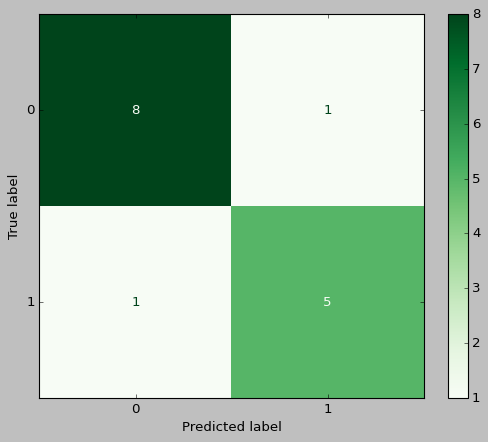

In [ ]:
# Import ConfusionMatrixDisplay
from sklearn.metrics import ConfusionMatrixDisplay
plt.style.use('classic')

disp = ConfusionMatrixDisplay(confusion_matrix = cnf_matrix,
                              display_labels = model_log.classes_)
disp.plot(cmap=plt.cm.Greens);



## **Evaluation of metrics based on stakeholder's needs**

Since this is the first part of our hypothesis, that education does in fact lend toward lower rates of unemployment, we should consider the performance of our model and how well it determined each of the testing data points and the accuracy of these predictions. plt.style.use('ggplot')

### **Accuracy: 86.6%**

Our accuracy on the test set is the same as the test score; overall we can make the assumption that our model performs well enough for the business problem despite the small sample set. <br>

### **Business Problem Results**

The data suggests that the higher levels of education contribute to lower rates of unemployment. Based on the hypothesis from taken from the quote out of Elen Theodossiou and Steven F. Hipple article, __['Unemployment remains high in 2010'](https://www.bls.gov/opub/mlr/2011/03/art1full.pdf)__, __"Workers with less education continued to experience a
substantially higher unemployment rate than did better educated members of the labor force."__(4), we can conclude that this is in fact apparently true. Counties in California with larger populations/concentrations of highly educated workers saw the highest rate of unemployment due to the pandemic, and on average the counties that experienced their highest rate of unemployment from the pandemic saw lower peak rates of unemployment outside of it. <br>

We found that counties that experienced their highest rate of unemployment outside of the pandemic had an average of 82.4% of the population with a high school education and an average of 20.44% of the population with college degrees.
<br>

For the counties that experienced their highest rate of unemployment inside of the pandemic, the average percentage of high school grads was 88.04% and the average percentage of college grads was 36.13%.
<br>

Furthermore, counties with higher average percentages of the population with college degrees also saw lower peak unemployment rates, 13.05% to 21.74%.

In [ ]:
# Final cell in notebook is meant to create new dataset

# c_e = county_ed.copy()
# c_e.to_csv('county_ed.csv', index=False)